In [1]:
import math
from pathlib import Path
import sys
import numpy as np
import pandas as pd
from scipy import stats
import statistics

import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns


from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans,DBSCAN
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression

In [2]:
sys.path.append("mirpy/")
sys.path.append("../")
#import TCRemb_code2
#import TCRemb_code3
import tcremb.TCRemb as TCRemb
import tcremb.ml_utils as ml_utils
import tcremb.data_proc as data_proc
import benchmark.metrics as metrics

In [3]:
import warnings
warnings.filterwarnings('ignore')

# Paths

In [4]:
#label_test = 'top_tetramer'
tcr_columns = ['cdr3aa','v','j','chain']
clonotype_id_column = 'cloneId'
#data_id= 'data_id'
annotation_id = 'annotId'
#pairing_id = 'barcode'
annotation_tcr_id_columns_dict = {'TRA': 'cloneId','TRB': 'cloneId','TRA_TRB': {'TRA':'cloneId_TRA', 'TRB':'cloneId_TRB'}}
res_path = 'results/figures/'

### Spedific

In [5]:
donor = 'donor1'
#donor = 'donor2'

In [6]:
label = 'top_tetramer'
label_high = 'top_tetramer_freq'


## folders for results tcremb/<run_name>
run_name = '10x_' + donor
## paired pipeline better in other folder
#run_name_paired = '10x_paired_' + donor

In [7]:
data_path = f'data/data_preped/10x_annot_data_{donor}.txt'
data_paired_path = f'data/data_preped/10x_annot_data_paired{donor}.txt'

In [8]:
outputs_path= "tcremb_outputs/" + run_name + '/'
Path(outputs_path).mkdir(parents=True, exist_ok=True)

# Load data

In [9]:
data_preped = pd.read_csv(data_path,sep='\t')


In [10]:
data_paired = pd.read_csv(data_paired_path,sep='\t')


## Data overview

<Axes: xlabel='Count', ylabel='top_tetramer'>

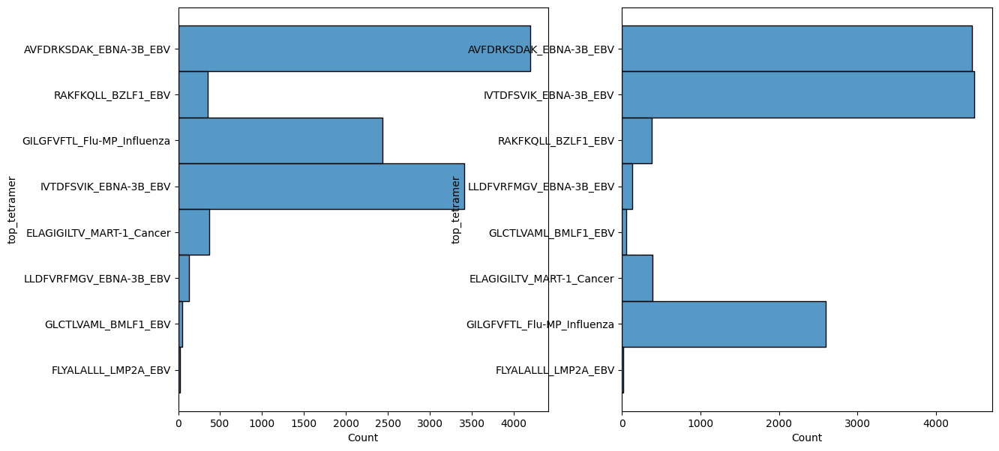

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(14, 7))
sns.histplot(y=data_preped[data_preped['chain']=='TRA'][label],  ax=axes[0])
sns.histplot(y=data_preped[data_preped['chain']=='TRB'][label],  ax=axes[1])

# TCRemb

In [12]:
tcremb_dict = {}

In [13]:
donor = 'donor1'

label = 'top_tetramer'
label_high = 'top_tetramer_freq'

## folders for results tcremb/<run_name>
run_name = '10x_' + donor
## paired pipeline better in other folder
#run_name_paired = '10x_paired_' + donor

data_path = f'data/data_preped/10x_annot_data_{donor}.txt'
data_paired_path = f'data/data_preped/10x_annot_data_paired{donor}.txt'

outputs_path= "tcremb_outputs/" + run_name + '/'
Path(outputs_path).mkdir(parents=True, exist_ok=True)

In [14]:
data_paired = pd.read_csv(data_paired_path,sep='\t')


In [15]:
tcremb_dict[donor] = TCRemb.TCRemb(run_name, data_paired) # init: input data saved, folder created
tcremb_dict[donor].tcremb_clonotypes('TRA') # clonotypes extraction
#tcremb_dict[donor].tcremb_dists_count('TRA') # dist scores count
tcremb_dict[donor].tcremb_dists('TRA') # dist scores extraction
tcremb_dict[donor].tcremb_pca('TRA')
tcremb_dict[donor].tcremb_tsne('TRA')

tcremb_dict[donor].tcremb_clonotypes('TRB')
#tcremb_dict[donor].tcremb_dists_count('TRB')
tcremb_dict[donor].tcremb_dists('TRB')
tcremb_dict[donor].tcremb_pca('TRB')
tcremb_dict[donor].tcremb_tsne('TRB')

chain ='TRA_TRB'
tcremb_dict[donor].tcremb_clonotypes(chain)
#tcremb_dict[donor].tcremb_dists_count(chain)
tcremb_dict[donor].tcremb_dists(chain)
tcremb_dict[donor].tcremb_pca(chain)
tcremb_dict[donor].tcremb_tsne(chain)

In [16]:
donor = 'donor2'

label = 'top_tetramer'
label_high = 'top_tetramer_freq'

## folders for results tcremb/<run_name>
run_name = '10x_' + donor
## paired pipeline better in other folder
#run_name_paired = '10x_paired_' + donor

data_path = f'data/data_preped/10x_annot_data_{donor}.txt'
data_paired_path = f'data/data_preped/10x_annot_data_paired{donor}.txt'

outputs_path= "tcremb_outputs/" + run_name + '/'
Path(outputs_path).mkdir(parents=True, exist_ok=True)

In [17]:
data_paired = pd.read_csv(data_paired_path,sep='\t')


In [18]:
tcremb_dict[donor] = TCRemb.TCRemb(run_name, data_paired) # init: input data saved, folder created
tcremb_dict[donor].tcremb_clonotypes('TRA') # clonotypes extraction
#tcremb_dict[donor].tcremb_dists_count('TRA') # dist scores count
tcremb_dict[donor].tcremb_dists('TRA') # dist scores extraction
tcremb_dict[donor].tcremb_pca('TRA')
tcremb_dict[donor].tcremb_tsne('TRA')

tcremb_dict[donor].tcremb_clonotypes('TRB')
#tcremb_dict[donor].tcremb_dists_count('TRB')
tcremb_dict[donor].tcremb_dists('TRB')
tcremb_dict[donor].tcremb_pca('TRB')
tcremb_dict[donor].tcremb_tsne('TRB')

chain ='TRA_TRB'
tcremb_dict[donor].tcremb_clonotypes(chain)
#tcremb_dict[donor].tcremb_dists_count(chain)
tcremb_dict[donor].tcremb_dists(chain)
tcremb_dict[donor].tcremb_pca(chain)
tcremb_dict[donor].tcremb_tsne(chain)

In [19]:
donor = 'donor3'

label = 'top_tetramer'
label_high = 'top_tetramer_freq'

## folders for results tcremb/<run_name>
run_name = '10x_' + donor
## paired pipeline better in other folder
#run_name_paired = '10x_paired_' + donor

data_path = f'data/data_preped/10x_annot_data_{donor}.txt'
data_paired_path = f'data/data_preped/10x_annot_data_paired{donor}.txt'

outputs_path= "tcremb_outputs/" + run_name + '/'
Path(outputs_path).mkdir(parents=True, exist_ok=True)

In [20]:
data_paired = pd.read_csv(data_paired_path,sep='\t')


In [21]:
tcremb_dict[donor] = TCRemb.TCRemb(run_name, data_paired) # init: input data saved, folder created
tcremb_dict[donor].tcremb_clonotypes('TRA') # clonotypes extraction
#tcremb_dict[donor].tcremb_dists_count('TRA') # dist scores count
tcremb_dict[donor].tcremb_dists('TRA') # dist scores extraction
tcremb_dict[donor].tcremb_pca('TRA')
tcremb_dict[donor].tcremb_tsne('TRA')

tcremb_dict[donor].tcremb_clonotypes('TRB')
#tcremb_dict[donor].tcremb_dists_count('TRB')
tcremb_dict[donor].tcremb_dists('TRB')
tcremb_dict[donor].tcremb_pca('TRB')
tcremb_dict[donor].tcremb_tsne('TRB')

chain ='TRA_TRB'
tcremb_dict[donor].tcremb_clonotypes(chain)
#tcremb_dict[donor].tcremb_dists_count(chain)
tcremb_dict[donor].tcremb_dists(chain)
tcremb_dict[donor].tcremb_pca(chain)
tcremb_dict[donor].tcremb_tsne(chain)

In [22]:
donor = 'donor4'

label = 'top_tetramer'
label_high = 'top_tetramer_freq'

## folders for results tcremb/<run_name>
run_name = '10x_' + donor
## paired pipeline better in other folder
#run_name_paired = '10x_paired_' + donor

data_path = f'data/data_preped/10x_annot_data_{donor}.txt'
data_paired_path = f'data/data_preped/10x_annot_data_paired{donor}.txt'

outputs_path= "tcremb_outputs/" + run_name + '/'
Path(outputs_path).mkdir(parents=True, exist_ok=True)

In [23]:
data_paired = pd.read_csv(data_paired_path,sep='\t')


In [24]:
tcremb_dict[donor] = TCRemb.TCRemb(run_name, data_paired) # init: input data saved, folder created
tcremb_dict[donor].tcremb_clonotypes('TRA') # clonotypes extraction
#tcremb_dict[donor].tcremb_dists_count('TRA') # dist scores count
tcremb_dict[donor].tcremb_dists('TRA') # dist scores extraction
tcremb_dict[donor].tcremb_pca('TRA')
tcremb_dict[donor].tcremb_tsne('TRA')

tcremb_dict[donor].tcremb_clonotypes('TRB')
#tcremb_dict[donor].tcremb_dists_count('TRB')
tcremb_dict[donor].tcremb_dists('TRB')
tcremb_dict[donor].tcremb_pca('TRB')
tcremb_dict[donor].tcremb_tsne('TRB')

chain ='TRA_TRB'
tcremb_dict[donor].tcremb_clonotypes(chain)
#tcremb_dict[donor].tcremb_dists_count(chain)
tcremb_dict[donor].tcremb_dists(chain)
tcremb_dict[donor].tcremb_pca(chain)
tcremb_dict[donor].tcremb_tsne(chain)

# Check clonotypes in VDJdb

In [51]:
vdjdb_data_path = 'mirpy/notebooks/assets/vdjdb.slim.txt'

vdjdb_data = pd.read_csv(vdjdb_data_path,sep='\t')
vdjdb_data = vdjdb_data.rename({'gene':'chain','v.segm':'v','j.segm':'j'},axis=1)
vdjdb_data = data_proc.remove_asterisk(vdjdb_data, tcr_columns)


def epitope_in_vdjdb(vdjdb_data, v, j, cdr3aa):
    epis = list(vdjdb_data[(vdjdb_data['v']==v)&(vdjdb_data['j']==j)&(vdjdb_data['cdr3aa']==cdr3aa)]['antigen.epitope'])
    if len(epis)==1:
        return epis[0]
    elif len(epis)>1:
        return epis
    else:
        None
    


In [65]:
vdjdb_data.shape

(75280, 16)

In [52]:
data_preped_copy = data_preped.copy()

In [53]:
data_preped_copy['epitope_vdjdb']=data_preped_copy.apply(lambda x: epitope_in_vdjdb(vdjdb_data, x.v, x.j, x.cdr3aa) ,axis=1)

In [61]:
tra_all_n = len(data_preped_copy[(data_preped_copy['chain']=='TRA')])
print(f"TRA barcodes count:{tra_all_n}")
trb_all_n = len(data_preped_copy[(data_preped_copy['chain']=='TRB')])
print(f"TRB barcodes count:{trb_all_n}")

TRA barcodes count:12237
TRB barcodes count:13693


In [62]:
tra_in_vdjdb_n = len(data_preped_copy[(data_preped_copy['chain']=='TRA')&(-data_preped_copy['epitope_vdjdb'].isna())])
print(f"TRA barcodes with clonotypes found in VDJdb count:{tra_in_vdjdb_n}")
trb_in_vdjdb_n = len(data_preped_copy[(data_preped_copy['chain']=='TRB')&(-data_preped_copy['epitope_vdjdb'].isna())])
print(f"TRB barcodes with clonotypes found in VDJdb count:{trb_in_vdjdb_n}")

TRA barcodes with clonotypes foind in VDJdb count:8548
TRB barcodes with clonotypes foind in VDJdb count:11233


In [64]:
print(f"TRA known proportion:{tra_in_vdjdb_n/tra_all_n}")
print(f"TRB known proportion:{trb_in_vdjdb_n/trb_all_n}")

TRA known proportion:0.698537223175615
TRB known proportion:0.8203461622726941


# Analysis

In [25]:
donor = 'donor1'
data_paired_path = f'data/data_preped/10x_annot_data_paired{donor}.txt'
data_paired = pd.read_csv(data_paired_path,sep='\t')

custom_palette = ml_utils.make_custom_palette(list(data_paired[label].drop_duplicates()))

In [26]:
custom_palette.keys()

dict_keys(['AVFDRKSDAK_EBNA-3B_EBV', 'RAKFKQLL_BZLF1_EBV', 'GILGFVFTL_Flu-MP_Influenza', 'IVTDFSVIK_EBNA-3B_EBV', 'ELAGIGILTV_MART-1_Cancer', 'LLDFVRFMGV_EBNA-3B_EBV', 'GLCTLVAML_BMLF1_EBV', 'FLYALALLL_LMP2A_EBV', 'other'])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

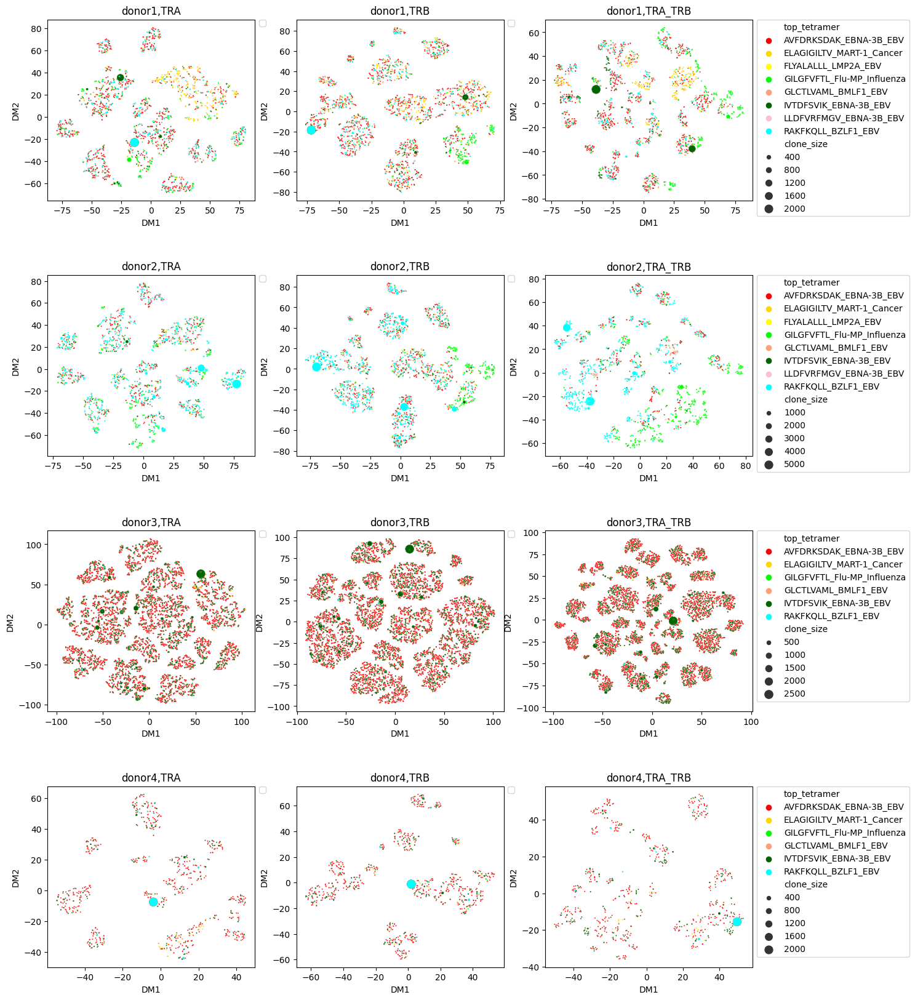

In [92]:


fig = plt.figure(figsize=(20,20))

delta_x=-0.01
delta_y=1.1
font_size=20


gs00 = fig.add_gridspec(15, 4)

ax1 = fig.add_subplot(gs00[:3, 0])
ax2 = fig.add_subplot(gs00[:3, 1])
ax3 = fig.add_subplot(gs00[:3, 2])
ax4 = fig.add_subplot(gs00[4:7, 0])
ax5 = fig.add_subplot(gs00[4:7, 1])
ax6 = fig.add_subplot(gs00[4:7, 2])
ax7 = fig.add_subplot(gs00[8:11, 0])
ax8 = fig.add_subplot(gs00[8:11, 1])
ax9 = fig.add_subplot(gs00[8:11, 2])
ax10 = fig.add_subplot(gs00[12:, 0])
ax11 = fig.add_subplot(gs00[12:, 1])
ax12 = fig.add_subplot(gs00[12:, 2])

donor = 'donor1'
chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax1,legend=False)

chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax2,legend=False)

chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax3)

donor = 'donor2'
chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax4,legend=False)

chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax5,legend=False)

chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax6)

donor = 'donor3'
chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax7,legend=False)

chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax8,legend=False)

chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax9)

donor = 'donor4'
chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax10,legend=False)

chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax11,legend=False)

chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tcremb_dict[donor].tsne_clones[chain],tcremb_dict[donor].annot[chain]), label,  f'{donor},{chain}', to_size = 'clone_size',custom_palette = custom_palette, ax = ax12)
plt.savefig(str(res_path + "tcremb_donors.png"),bbox_inches='tight')
plt.show()


## Clustering

### dbscan

In [27]:
dbscan_dict = {'donor1':TCRemb.TCRemb_clustering('DBSCAN'),'donor2':TCRemb.TCRemb_clustering('DBSCAN'),'donor3':TCRemb.TCRemb_clustering('DBSCAN'),'donor4':TCRemb.TCRemb_clustering('DBSCAN')}

In [28]:
metrics_dbscan={}

In [29]:
metrics_dbscan[label]={}
metrics_dbscan[label]['donor1']={}
metrics_dbscan[label]['donor2']={}
metrics_dbscan[label]['donor3']={}
metrics_dbscan[label]['donor4']={}

In [30]:
chain='TRA'
donor = 'donor1'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))


donor = 'donor2'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))

donor = 'donor3'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))


donor = 'donor4'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))

purity:0.9827853331038044
purity:0.9848265441037587
purity:0.7043668122270742
purity:0.7142857142857143


In [31]:
chain='TRB'
donor = 'donor1'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))


donor = 'donor2'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))

donor = 'donor3'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))


donor = 'donor4'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))

purity:0.9934539190353144
purity:0.9927413127413127
purity:0.7171783148269105
purity:0.9529609407811844


In [32]:
chain='TRA_TRB'
donor = 'donor1'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))


donor = 'donor2'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))

donor = 'donor3'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))


donor = 'donor4'
model = DBSCAN(eps=750, min_samples=2)
dbscan_dict[donor].clstr(chain,tcremb_dict[donor], label, model=model)
df = tcremb_dict[donor].annot[chain].merge(dbscan_dict[donor].clstr_labels[chain])
metrics_dbscan[label][donor][chain] = metrics.get_clustermetrics(df, label)
metrics_dbscan[label][donor][chain]['total pairs TCR-top tetramer'] = len(tcremb_dict[donor].annot[chain])
metrics_dbscan[label][donor][chain]['total unique TCRs'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(tcremb_dict[donor].clonotype_id)))
metrics_dbscan[label][donor][chain]['total unique top tetramers'] = str(len(tcremb_dict[donor].annot[chain].drop_duplicates(label)))

purity:0.9959903769045709
purity:0.995688180138252
purity:0.6971975393028025
purity:0.625


In [33]:
donor='donor1'
metrcs_res = pd.DataFrame(metrics_dbscan[label][donor])
metrcs_res

,TRA,TRB,TRA_TRB
purity,0.98,0.99,1.0
retention,0.54,0.46,0.38
consistency,0.1024,0.1475,0.1179
ami,0.93,0.96,0.98
precision,0.98,0.99,1.0
recall,0.98,0.99,1.0
f1-score,0.98,0.99,1.0
mean_clustsize,62.46,263.86,143.88
total pairs TCR-top tetramer,10801,12496,9778
total unique TCRs,2454,2554,2319


In [34]:
donor='donor2'
metrcs_res = pd.DataFrame(metrics_dbscan[label][donor])
metrcs_res

,TRA,TRB,TRA_TRB
purity,0.98,0.99,1.0
retention,0.5,0.52,0.62
consistency,0.0759,0.0913,0.0811
ami,0.91,0.94,0.95
precision,0.98,0.99,0.99
recall,0.98,0.99,1.0
f1-score,0.98,0.99,1.0
mean_clustsize,155.72,388.5,208.73
total pairs TCR-top tetramer,32025,37085,23711
total unique TCRs,2163,2257,1974


In [35]:
donor='donor3'
metrcs_res = pd.DataFrame(metrics_dbscan[label][donor])
metrcs_res

,TRA,TRB,TRA_TRB
purity,0.7,0.72,0.7
retention,0.19,0.06,0.07
consistency,0.0383,0.3086,0.2703
ami,0.03,0.03,0.02
precision,0.67,0.69,0.66
recall,0.7,0.72,0.7
f1-score,0.69,0.7,0.68
mean_clustsize,10.09,19.14,47.19
total pairs TCR-top tetramer,23804,25383,20876
total unique TCRs,9074,10265,8903


In [36]:
donor='donor4'
metrcs_res = pd.DataFrame(metrics_dbscan[label][donor])
metrcs_res

,TRA,TRB,TRA_TRB
purity,0.71,0.95,0.62
retention,0.01,0.63,0.0
consistency,0.119,0.2497,0.1875
ami,0.06,0.02,-0.15
precision,0.71,0.94,0.6
recall,0.71,0.95,0.62
f1-score,0.71,0.95,0.61
mean_clustsize,2.62,1190.5,2.67
total pairs TCR-top tetramer,3776,3766,3506
total unique TCRs,716,788,696


In [37]:
dbscan_dict['donor4'].clstr_labels['TRA_TRB']

,cluster,annotId,label_cluster,total_cluster,total_group,count_matched,fraction_matched,fraction_matched_exp,p_value,is_cluster,enriched_clstr,a_cdr3aa,TRAV,TRAJ,b_cdr3aa,TRBV,TRBJ
0,-1,0,IVTDFSVIK_EBNA-3B_EBV,3498,2639,2634,0.753002,0.75271,0.493161,0,0,CALSDLKAAGNKLTF,TRAV9-2,TRAJ17,CASSQDLSRLNTEAFF,TRBV4-3,TRBJ1-1
1,-1,1,IVTDFSVIK_EBNA-3B_EBV,3498,2639,2634,0.753002,0.75271,0.493161,0,0,CAVNWEEQGGSYIPTF,TRAV12-2,TRAJ6,CASRVSGSLSYNEQFF,TRBV27,TRBJ2-1
2,-1,2,IVTDFSVIK_EBNA-3B_EBV,3498,2639,2634,0.753002,0.75271,0.493161,0,0,CAVDLMKTSYDKVIF,TRAV21,TRAJ50,CASRTGLASTDTQYF,TRBV6-6,TRBJ2-3
3,-1,3,IVTDFSVIK_EBNA-3B_EBV,3498,2639,2634,0.753002,0.75271,0.493161,0,0,CAVDLMKTSYDKVIF,TRAV21,TRAJ50,CASRTGLASTDTQYF,TRBV6-6,TRBJ2-3
4,-1,4,IVTDFSVIK_EBNA-3B_EBV,3498,2639,2634,0.753002,0.75271,0.493161,0,0,CAVDLMKTSYDKVIF,TRAV21,TRAJ50,CASRTGLASTDTQYF,TRBV6-6,TRBJ2-3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3501,-1,3503,IVTDFSVIK_EBNA-3B_EBV,3498,2639,2634,0.753002,0.75271,0.493161,0,0,CALSEALGNEKLTF,TRAV19,TRAJ48,CASSPHRSLSEINNYGYTF,TRBV7-2,TRBJ1-2
3502,-1,3504,IVTDFSVIK_EBNA-3B_EBV,3498,2639,2634,0.753002,0.75271,0.493161,0,0,CAVSGNTPLVF,TRAV8-6,TRAJ29,CASSPLPRLAGEETQYF,TRBV7-8,TRBJ2-5
3503,-1,3505,IVTDFSVIK_EBNA-3B_EBV,3498,2639,2634,0.753002,0.75271,0.493161,0,0,CAVRLHNYGQNFVF,TRAV3,TRAJ26,CSAPARSEPYEQYF,TRBV20-1,TRBJ2-7
3504,-1,3506,IVTDFSVIK_EBNA-3B_EBV,3498,2639,2634,0.753002,0.75271,0.493161,0,0,CAVDLMKTSYDKVIF,TRAV21,TRAJ50,CASRTGLASTDTQYF,TRBV6-6,TRBJ2-3


In [38]:
dbscan_dict['donor1']

In [39]:
br = dbscan_dict['donor1'].binom_res['TRB'][dbscan_dict['donor1'].binom_res['TRB']['cluster']!=-1]
br.sort_values('p_value').head(12)

,top_tetramer,cluster,total_cluster,total_group,count_matched,fraction_matched,fraction_matched_exp,p_value,is_cluster,enriched_clstr
3968,IVTDFSVIK_EBNA-3B_EBV,5,3672,4486,3666,0.998366,0.358995,0.000000e+00,1,1
2110,GILGFVFTL_Flu-MP_Influenza,2,1303,2591,1299,0.996930,0.207346,0.000000e+00,1,1
3052,GILGFVFTL_Flu-MP_Influenza,3,417,2591,416,0.997602,0.207346,1.841589e-282,1,1
3479,LLDFVRFMGV_EBNA-3B_EBV,4,66,132,65,0.984848,0.010563,2.302457e-127,1,1
9200,GILGFVFTL_Flu-MP_Influenza,9,85,2591,82,0.964706,0.207346,4.624793e-52,1,1
9511,GILGFVFTL_Flu-MP_Influenza,12,54,2591,54,1.000000,0.207346,1.263588e-37,1,1
1922,AVFDRKSDAK_EBNA-3B_EBV,0,114,4450,97,0.850877,0.356114,1.474319e-27,1,1
9635,GILGFVFTL_Flu-MP_Influenza,13,18,2591,18,1.000000,0.207346,5.018052e-13,1,1
10758,GILGFVFTL_Flu-MP_Influenza,18,13,2591,13,1.000000,0.207346,1.309342e-09,1,1
10064,GILGFVFTL_Flu-MP_Influenza,16,12,2591,12,1.000000,0.207346,6.314759e-09,1,1


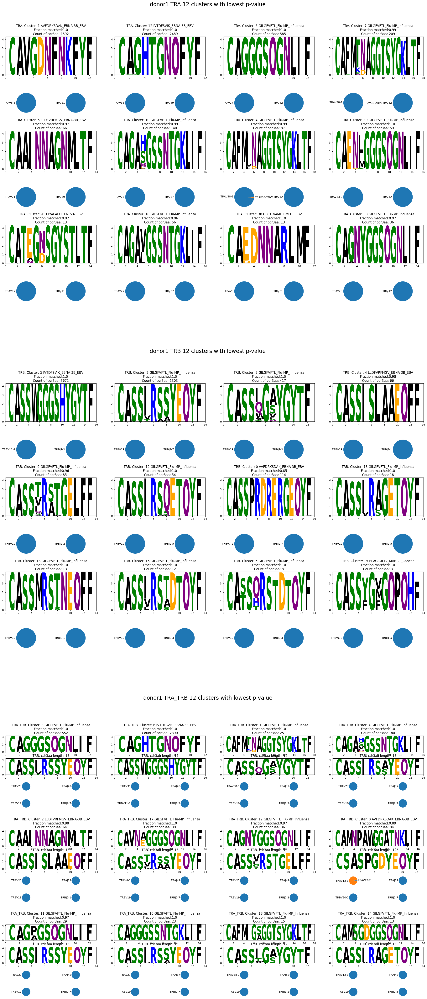

In [40]:
donor = 'donor1'
fig = plt.figure(figsize=(28,6*9))
subfigs = fig.subfigures(3, 1)
dbscan_dict[donor].clstrs_motif(tcremb_dict[donor],'TRA', 12, subfigs[0])
subfigs[0].suptitle(f'{donor} TRA 12 clusters with lowest p-value',fontsize=20)
dbscan_dict[donor].clstrs_motif(tcremb_dict[donor], 'TRB', 12, subfigs[1])
subfigs[1].suptitle(f'{donor} TRB 12 clusters with lowest p-value',fontsize=20)
dbscan_dict[donor].clstrs_motif(tcremb_dict[donor], 'TRA_TRB', 12, subfigs[2])
subfigs[2].suptitle(f'{donor} TRA_TRB 12 clusters with lowest p-value',fontsize=20)
plt.savefig(f"results/figures/{donor}_dbscan_logo.png")

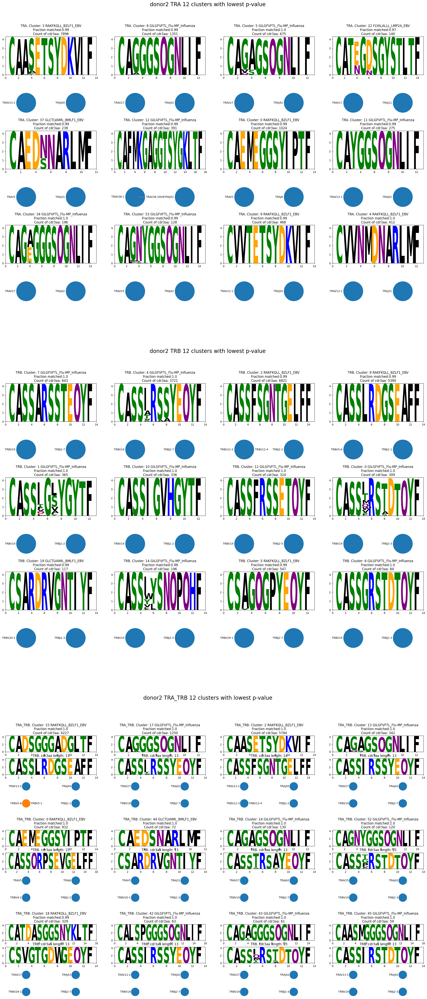

In [41]:
donor = 'donor2'
fig = plt.figure(figsize=(28,6*9))
subfigs = fig.subfigures(3, 1)
dbscan_dict[donor].clstrs_motif(tcremb_dict[donor],'TRA', 12, subfigs[0])
subfigs[0].suptitle(f'{donor} TRA 12 clusters with lowest p-value',fontsize=20)
dbscan_dict[donor].clstrs_motif(tcremb_dict[donor], 'TRB', 12, subfigs[1])
subfigs[1].suptitle(f'{donor} TRB 12 clusters with lowest p-value',fontsize=20)
dbscan_dict[donor].clstrs_motif(tcremb_dict[donor], 'TRA_TRB', 12, subfigs[2])
subfigs[2].suptitle(f'{donor} TRA_TRB 12 clusters with lowest p-value',fontsize=20)
plt.savefig(f"results/figures/{donor}_dbscan_logo.png")

### Kmeans

In [30]:
kmeans = TCRemb.TCRemb_clustering('KMeans')

In [31]:
chain='TRA'
n_clusters = 2537
random_state = 8
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
kmeans.clstr(chain,tcremb, label,model)

mean fraction_mached only clusters: 0.6394950361692117
median fraction_mached only clusters: 0.5
purity:0.8580847723704866


In [32]:
chain='TRB'
n_clusters = 3026
random_state = 8
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
kmeans.clstr(chain,tcremb, label,model)

mean fraction_mached only clusters: 0.6466062732165645
median fraction_mached only clusters: 0.5
purity:0.8947832994968664


In [33]:
chain='TRA_TRB'
n_clusters = 3026
random_state = 8
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
kmeans.clstr(chain,tcremb_paired, label,model)

mean fraction_mached only clusters: 0.7151806825621065
median fraction_mached only clusters: 0.6666666666666666
purity:0.8918950167649439


Text(0.5, 1.0, 'count of tcrs in enriched clusters')

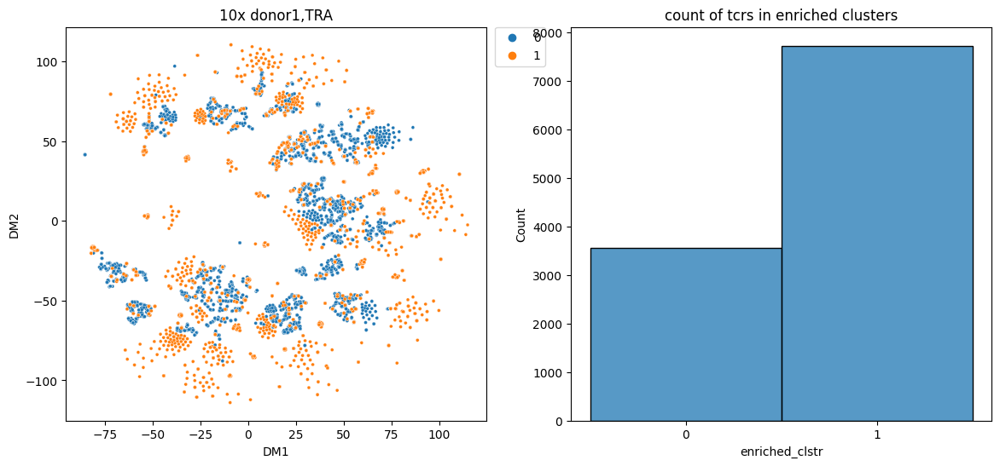

In [34]:
chain = 'TRA'
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(14, 6))
ml_utils.tsne_plot(pd.merge(tcremb.tsne[chain],kmeans.clstr_labels[chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', ax=axes[0])

sns.histplot(kmeans.clstr_labels[chain]['enriched_clstr'].astype(str), ax = axes[1])
axes[1].set_title('count of tcrs in enriched clusters')

Text(0.5, 1.0, 'count of tcrs in enriched clusters')

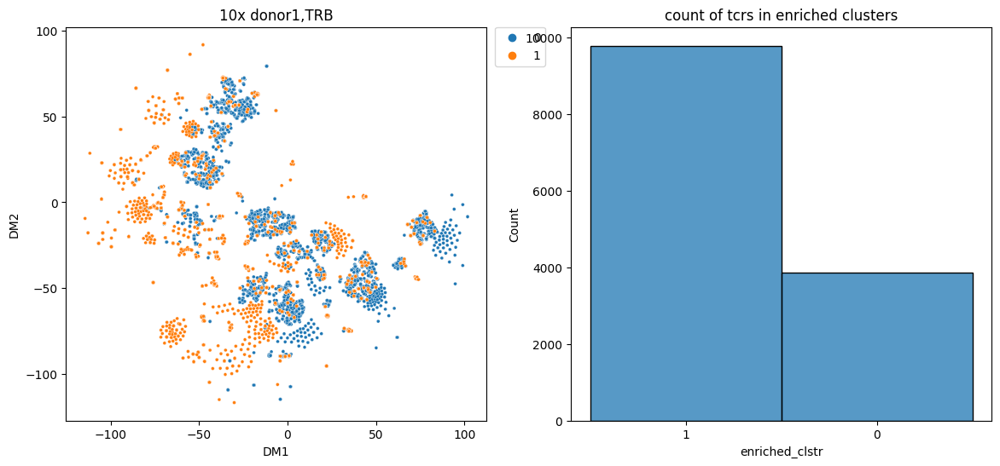

In [35]:
chain = 'TRB'
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(14, 6))
ml_utils.tsne_plot(pd.merge(tcremb.tsne[chain],kmeans.clstr_labels[chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', ax=axes[0])

sns.histplot(kmeans.clstr_labels[chain]['enriched_clstr'].astype(str), ax = axes[1])
axes[1].set_title('count of tcrs in enriched clusters')

Text(0.5, 1.0, 'count of tcrs in enriched clusters')

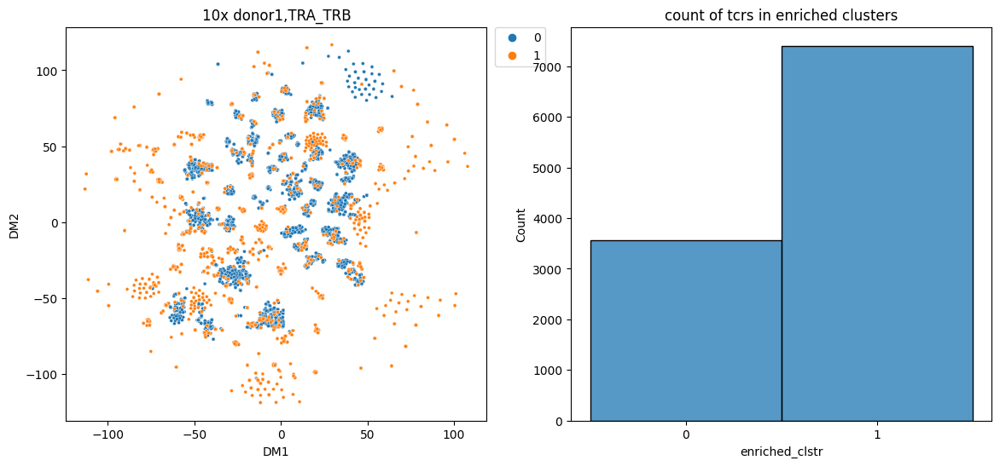

In [36]:
chain = 'TRA_TRB'
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(14, 6))
ml_utils.tsne_plot(pd.merge(tcremb_paired.tsne[chain],kmeans.clstr_labels[chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', ax=axes[0])

sns.histplot(kmeans.clstr_labels[chain]['enriched_clstr'].astype(str), ax = axes[1])
axes[1].set_title('count of tcrs in enriched clusters')

In [1]:
kmeans.clstr_labels[chain]['enriched_clstr']

NameError: name 'kmeans' is not defined

In [ ]:
chain = 'TRA_TRB'
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(14, 6))
ml_utils.tsne_plot(pd.merge(tcremb_paired.tsne[chain],kmeans.clstr_labels[chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', ax=axes[0])

sns.histplot(kmeans.clstr_labels[chain]['enriched_clstr'].astype(str), ax = axes[1])
sizes = 
axes[1].pie(kmeans.clstr_labels[chain]['enriched_clstr'].astype(str), labels=)
axes[1].set_title('count of tcrs in enriched clusters')


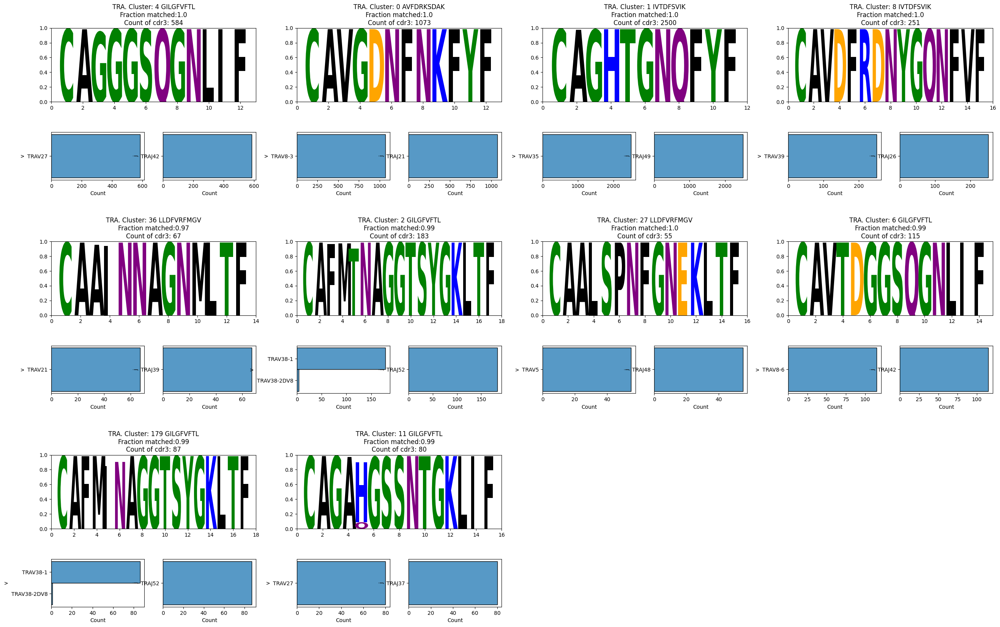

In [34]:
chain = 'TRA'
kmeans.clstrs_motif(tcremb, chain, 10)

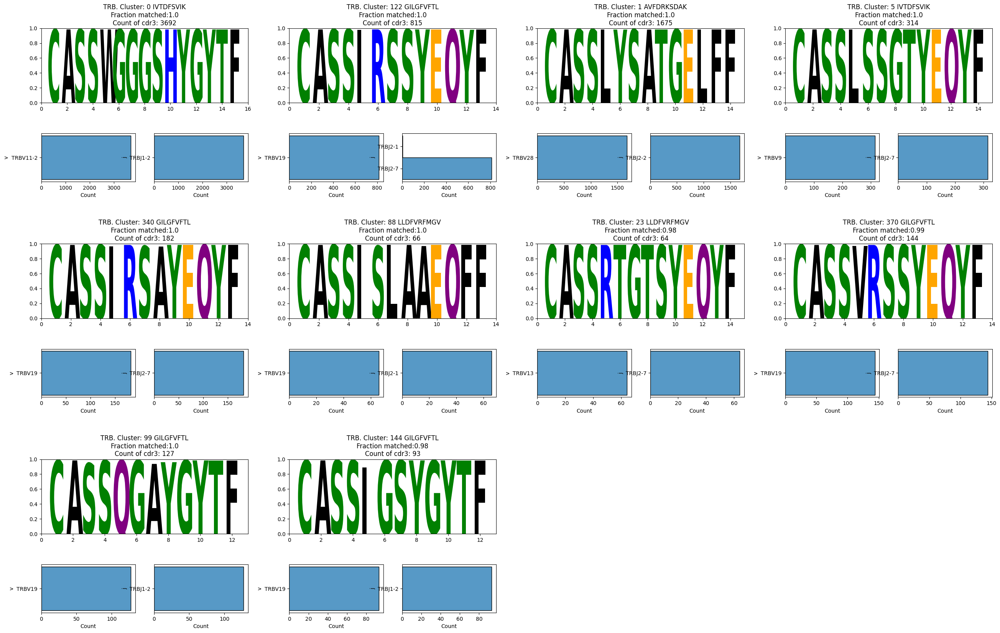

In [35]:
chain = 'TRB'
kmeans.clstrs_motif(tcremb, chain, 10)

In [114]:
model_name = 'KMeans_label_high'
threshold = 0.75
clstr_dict[model_name]= {'binom_res':{},'clstr_metrics':{}}
tcremb['clstr_labels'][model_name]={}

In [115]:
chain = 'TRA'
label_cl = label_high
n_clusters = 2244
random_state = 8

y_data = tcremb['annot'][chain][label_cl]
X_data = tcremb['pca'][chain]

## fit
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
tcremb['clstr_labels'][model_name][chain] = TCRemb_code2.clstr_model(model, X_data , annotation_id)

## evaluation
clstr_dict[model_name]['binom_res'][chain] = TCRemb_code2.binominal_test(pd.merge(tcremb['clstr_labels'][model_name][chain],tcremb['annot'][chain]), 'cluster', label_cl)

clstr_dict[model_name]['binom_res'][chain]['enriched_clstr'] =clstr_dict[model_name]['binom_res'][chain].apply(lambda x:1 
                                                                                                               if (x.fraction_matched>=threshold)
                                                                                                               and (x.total_cluster>2) else 0,axis=1)
clstr_dict[model_name]['clstr_metrics'][chain] = TCRemb_code2.clstr_metrics(tcremb['annot'][chain][label_cl],tcremb['clstr_labels'][model_name][chain]['cluster'])

tcremb['clstr_labels'][model_name][chain] = tcremb['clstr_labels'][model_name][chain].merge(clstr_dict[model_name]['binom_res'][chain].rename({label_cl:str('clstr_' + label_cl)},axis=1)
                                                                                            , on='cluster').sort_values(annotation_id).reset_index(drop=True)

In [116]:
print('mean fraction_matched: ' + str(statistics.mean(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
print('median fraction_matched: ' + str(statistics.median(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
clstr_dict[model_name]['clstr_metrics'][chain]

mean fraction_mached: 0.9185752577767673
median fraction_mached: 1.0


{'homogeneity_score': 0.8696875279518915,
 'completeness_score': 0.23551001865701462,
 'v_measure_score': 0.3706488972259765,
 'adjusted_rand_score': 0.16459490731373635,
 'adjusted_mutual_info_score': 0.3451237807551854}

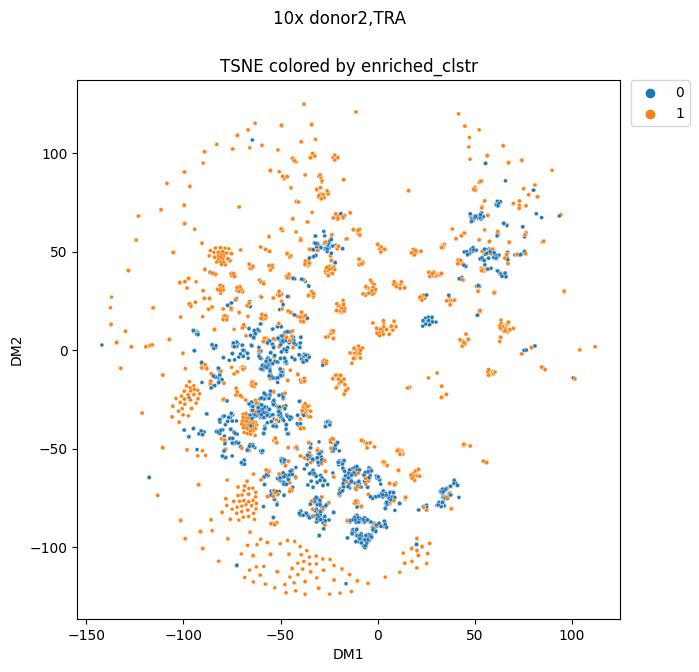

In [117]:
chain = 'TRA'
TCRemb_code2.tsne_plot(pd.merge(tcremb['tsne'][chain],tcremb['clstr_labels'][model_name][chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', True)

Text(0.5, 1.0, 'count of tcrs in enriched clusters')

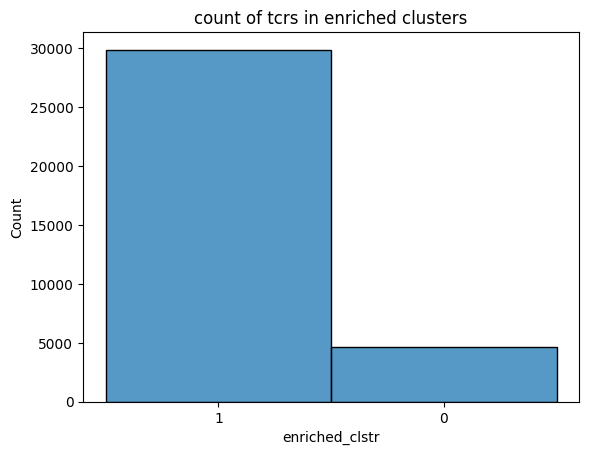

In [118]:
sns.histplot(tcremb['clstr_labels'][model_name][chain]['enriched_clstr'].astype(str))
plt.title('count of tcrs in enriched clusters')

In [119]:
chain = 'TRB'
label_cl = label_high
n_clusters = 2672
random_state = 8

y_data = tcremb['annot'][chain][label_cl]
X_data = tcremb['pca'][chain]

## fit
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
tcremb['clstr_labels'][model_name][chain] = TCRemb_code2.clstr_model(model, X_data , annotation_id)

## evaluation
clstr_dict[model_name]['binom_res'][chain] = TCRemb_code2.binominal_test(pd.merge(tcremb['clstr_labels'][model_name][chain],tcremb['annot'][chain]), 'cluster', label_cl)
clstr_dict[model_name]['binom_res'][chain]['enriched_clstr_1'] =clstr_dict[model_name]['binom_res'][chain].apply(lambda x:1 
                                                                                                               if (x.fraction_matched>=threshold)
                                                                                                               and (x.total_cluster>2) else 0,axis=1)
clstr_dict[model_name]['binom_res'][chain]['enriched_clstr'] =clstr_dict[model_name]['binom_res'][chain].apply(lambda x:1 
                                                                                                               if (x.fraction_matched>=0.9)
                                                                                                               and (x.total_cluster>2) else 0,axis=1)
clstr_dict[model_name]['clstr_metrics'][chain] = TCRemb_code2.clstr_metrics(tcremb['annot'][chain][label_cl],tcremb['clstr_labels'][model_name][chain]['cluster'])

tcremb['clstr_labels'][model_name][chain] = tcremb['clstr_labels'][model_name][chain].merge(clstr_dict[model_name]['binom_res'][chain].rename({label_cl:str('clstr_' + label_cl)},axis=1)
                                                                                            , on='cluster').sort_values(annotation_id).reset_index(drop=True)

In [120]:
print('mean fraction_matched: ' + str(statistics.mean(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
print('median fraction_matched: ' + str(statistics.median(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
clstr_dict[model_name]['clstr_metrics'][chain]

mean fraction_mached: 0.9261850234465085
median fraction_mached: 1.0


{'homogeneity_score': 0.8731714685973871,
 'completeness_score': 0.23474075836476288,
 'v_measure_score': 0.3700093341925485,
 'adjusted_rand_score': 0.14224737325266054,
 'adjusted_mutual_info_score': 0.3447833174676751}

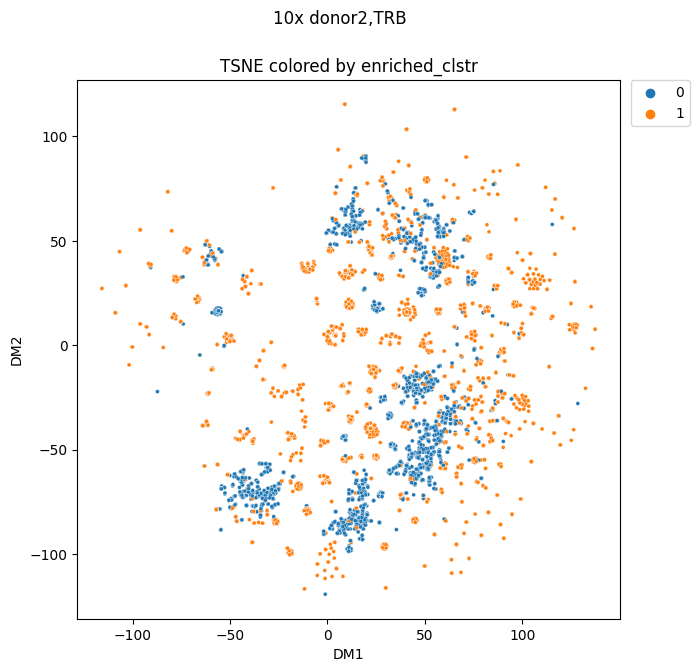

In [121]:
chain = 'TRB'
TCRemb_code2.tsne_plot(pd.merge(tcremb['tsne'][chain],tcremb['clstr_labels'][model_name][chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', True)

Text(0.5, 1.0, 'count of tcrs in enriched clusters')

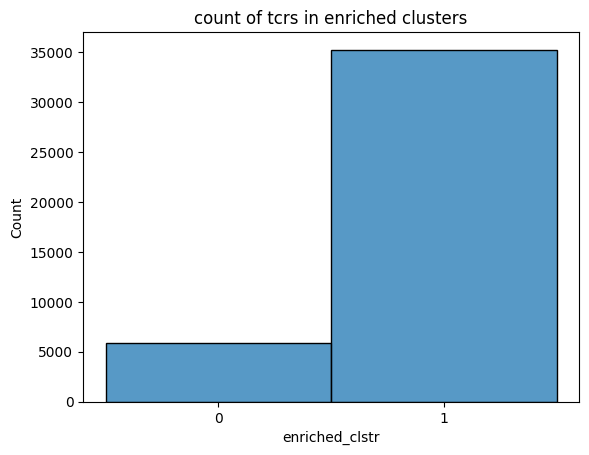

In [122]:
sns.histplot(tcremb['clstr_labels'][model_name][chain]['enriched_clstr'].astype(str))
plt.title('count of tcrs in enriched clusters')

In [123]:
chain = 'TRA_TRB'
label_cl = label_high
n_clusters = 2672
random_state = 8

y_data = tcremb['annot'][chain][label_cl]
X_data = tcremb['pca'][chain]

## fit
model =  KMeans(n_clusters=n_clusters, random_state=random_state)
tcremb['clstr_labels'][model_name][chain] = TCRemb_code2.clstr_model(model, X_data , annotation_id)

## evaluation
clstr_dict[model_name]['binom_res'][chain] = TCRemb_code2.binominal_test(pd.merge(tcremb['clstr_labels'][model_name][chain],tcremb['annot'][chain]), 'cluster', label_cl)
clstr_dict[model_name]['binom_res'][chain]['enriched_clstr'] =clstr_dict[model_name]['binom_res'][chain].apply(lambda x:1 
                                                                                                               if (x.fraction_matched>=threshold)
                                                                                                               and (x.total_cluster>2) else 0,axis=1)
clstr_dict[model_name]['clstr_metrics'][chain] = TCRemb_code2.clstr_metrics(tcremb['annot'][chain][label_cl],tcremb['clstr_labels'][model_name][chain]['cluster'])

tcremb['clstr_labels'][model_name][chain] = tcremb['clstr_labels'][model_name][chain].merge(clstr_dict[model_name]['binom_res'][chain].rename({label_cl:str('clstr_' + label_cl)},axis=1)
                                                                                            , on='cluster').sort_values(annotation_id).reset_index(drop=True)

In [124]:
print('mean fraction_matched: ' + str(statistics.mean(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
print('median fraction_matched: ' + str(statistics.median(clstr_dict[model_name]['binom_res'][chain]['fraction_matched'])))
clstr_dict[model_name]['clstr_metrics'][chain]

mean fraction_mached: 0.9247156934741245
median fraction_mached: 1.0


{'homogeneity_score': 0.9028186705136068,
 'completeness_score': 0.22230646008163707,
 'v_measure_score': 0.3567646251600634,
 'adjusted_rand_score': 0.132134943198575,
 'adjusted_mutual_info_score': 0.3256599309096361}

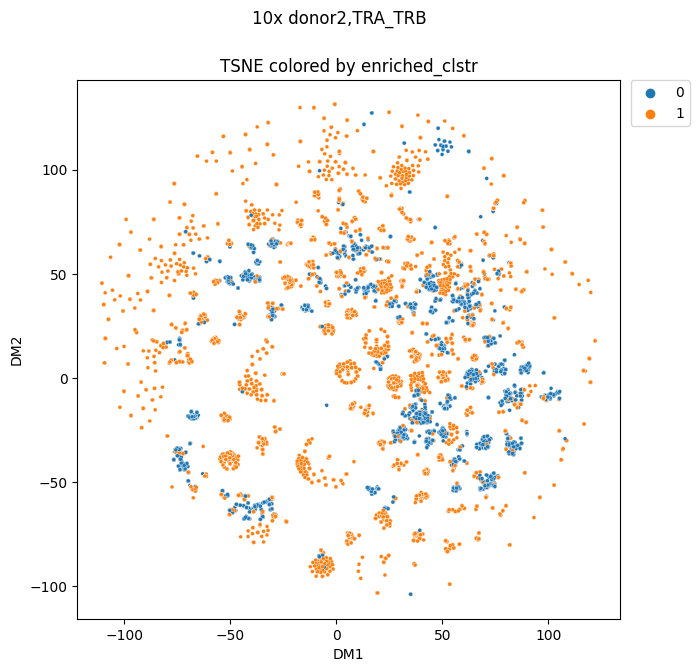

In [125]:
chain = 'TRA_TRB'
TCRemb_code2.tsne_plot(pd.merge(tcremb['tsne'][chain],tcremb['clstr_labels'][model_name][chain],on=annotation_id), 'enriched_clstr', f'10x {donor},{chain}', f'TSNE colored by enriched_clstr', True)

Text(0.5, 1.0, 'count of tcrs in enriched clusters')

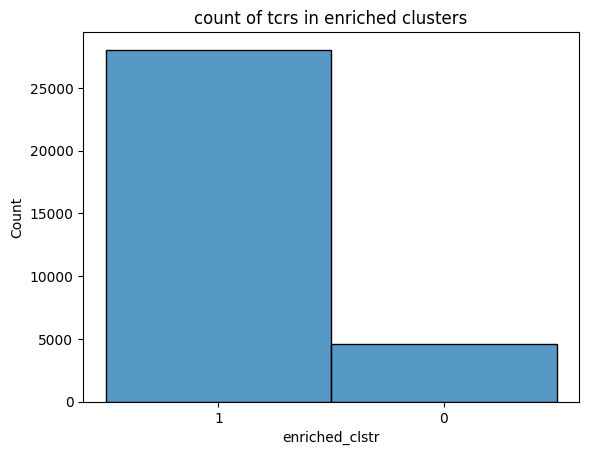

In [126]:
sns.histplot(tcremb['clstr_labels'][model_name][chain]['enriched_clstr'].astype(str))
plt.title('count of tcrs in enriched clusters')

## Classification

### RF

In [40]:
clf_dict = {}

In [52]:
donor='donor1'

In [53]:
clf_dict[donor] = TCRemb.TCRemb_clf('RF')
chain='TRA'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

chain='TRB'
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

chain='TRA_TRB'
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

Train accuracy: 0.9677248677248678
Test accuracy: 0.8978710274606603
macro: {'f1': 0.7716044755468087, 'precision': 0.7385115979126613, 'recall': 0.8623253901840766}
weighted: {'f1': 0.9068482989476347, 'precision': 0.9249354546654935, 'recall': 0.8978710274606603}
Train accuracy: 0.9762204184291757
Test accuracy: 0.9026407041877834
macro: {'f1': 0.7472537830172967, 'precision': 0.7136376089903569, 'recall': 0.9105664312834896}
weighted: {'f1': 0.9163159828349747, 'precision': 0.9429965286005647, 'recall': 0.9026407041877834}
Train accuracy: 0.6018410286382233
Test accuracy: 0.4775051124744376
macro: {'f1': 0.15956412321412672, 'precision': 0.17244982352679145, 'recall': 0.16775697731209882}
weighted: {'f1': 0.5266326603274328, 'precision': 0.6144857113896683, 'recall': 0.4775051124744376}


In [54]:
donor='donor2'

In [55]:
clf_dict[donor] = TCRemb.TCRemb_clf('RF')
chain='TRA'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

chain='TRB'
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

chain='TRA_TRB'
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

Train accuracy: 0.9732345987420261
Test accuracy: 0.9441090757701915
macro: {'f1': 0.7336018776444763, 'precision': 0.741003483786779, 'recall': 0.7757253114286874}
weighted: {'f1': 0.9468932506808506, 'precision': 0.9550560374199779, 'recall': 0.9441090757701915}
Train accuracy: 0.9740359798143226
Test accuracy: 0.9522739529031098
macro: {'f1': 0.7112958936816096, 'precision': 0.7038911723311785, 'recall': 0.752615033206546}
weighted: {'f1': 0.9543695401669317, 'precision': 0.9602755142853188, 'recall': 0.9522739529031098}
Train accuracy: 0.7301922034102548
Test accuracy: 0.7067753725049198
macro: {'f1': 0.10686789267945986, 'precision': 0.1255022756942126, 'recall': 0.13420630107646347}
weighted: {'f1': 0.8205257578927325, 'precision': 0.9806386744397461, 'recall': 0.7067753725049198}


In [56]:
donor='donor3'

In [57]:
clf_dict[donor] = TCRemb.TCRemb_clf('RF')
chain='TRA'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

chain='TRB'
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

chain='TRA_TRB'
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

Train accuracy: 0.7785980074420837
Test accuracy: 0.7142257070848502
macro: {'f1': 0.2277656764981037, 'precision': 0.22807159714688768, 'recall': 0.4291745799853908}
weighted: {'f1': 0.7998554062047931, 'precision': 0.9290057866411031, 'recall': 0.7142257070848502}
Train accuracy: 0.7855695632597929
Test accuracy: 0.719107025607354
macro: {'f1': 0.18691967694778241, 'precision': 0.20556961273461632, 'recall': 0.2305038043315315}
weighted: {'f1': 0.8064513818486814, 'precision': 0.9366571604916893, 'recall': 0.719107025607354}
Train accuracy: 0.823034284541162
Test accuracy: 0.7068497525147692
macro: {'f1': 0.17284279711953804, 'precision': 0.2006582937751284, 'recall': 0.2069566150754488}
weighted: {'f1': 0.8134444157057171, 'precision': 0.9668731826970693, 'recall': 0.7068497525147692}


In [58]:
donor='donor4'

In [59]:
clf_dict[donor] = TCRemb.TCRemb_clf('RF')
chain='TRA'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

chain='TRB'
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

chain='TRA_TRB'
clf_dict[donor].clf(chain,tcremb_dict[donor], label,test_size=0.3)

Train accuracy: 0.9099508134695422
Test accuracy: 0.8420123565754634
macro: {'f1': 0.2674510344771636, 'precision': 0.27279453033318024, 'recall': 0.26290673293468975}
weighted: {'f1': 0.8449844052679443, 'precision': 0.8493993898044135, 'recall': 0.8420123565754634}
Train accuracy: 0.9089529590288316
Test accuracy: 0.8362831858407079
macro: {'f1': 0.26750903973865237, 'precision': 0.27168990201444565, 'recall': 0.2639276044320555}
weighted: {'f1': 0.8381528802307805, 'precision': 0.8412069720574631, 'recall': 0.8362831858407079}
Train accuracy: 0.8549307253463733
Test accuracy: 0.7433460076045627
macro: {'f1': 0.2175621092237039, 'precision': 0.22120087611087333, 'recall': 0.2469162580158431}
weighted: {'f1': 0.7965763688833563, 'precision': 0.8785434872111303, 'recall': 0.7433460076045627}


accuracy: 0.9
f1_weighted:0.91
precision:0.92
recall:0.9
accuracy: 0.9
f1_weighted:0.92
precision:0.94
recall:0.9
accuracy: 0.48
f1_weighted:0.53
precision:0.61
recall:0.48
accuracy: 0.94
f1_weighted:0.95
precision:0.96
recall:0.94
accuracy: 0.95
f1_weighted:0.95
precision:0.96
recall:0.95
accuracy: 0.71
f1_weighted:0.82
precision:0.98
recall:0.71
accuracy: 0.71
f1_weighted:0.8
precision:0.93
recall:0.71
accuracy: 0.72
f1_weighted:0.81
precision:0.94
recall:0.72
accuracy: 0.71
f1_weighted:0.81
precision:0.97
recall:0.71
accuracy: 0.84
f1_weighted:0.84
precision:0.85
recall:0.84
accuracy: 0.84
f1_weighted:0.84
precision:0.84
recall:0.84
accuracy: 0.74
f1_weighted:0.8
precision:0.88
recall:0.74


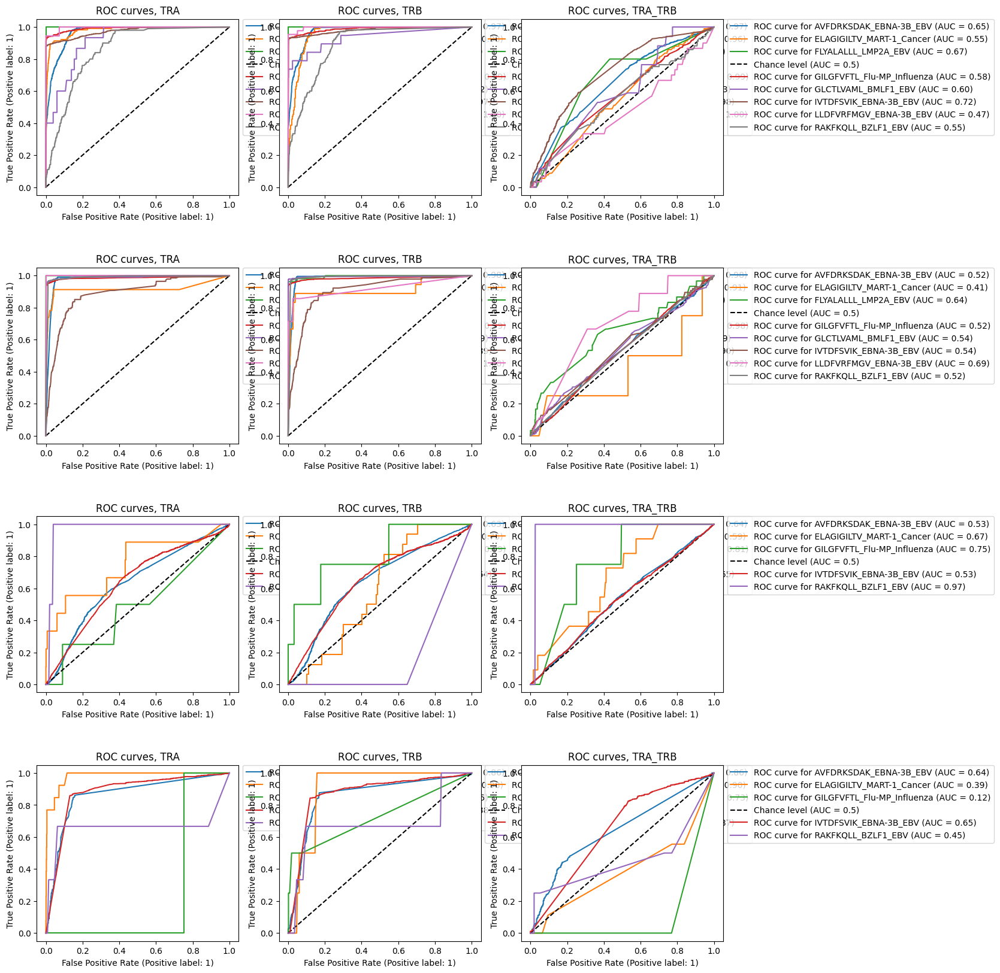

In [60]:


fig = plt.figure(figsize=(20,20))

delta_x=-0.01
delta_y=1.1
font_size=20


gs00 = fig.add_gridspec(15, 4)

ax1 = fig.add_subplot(gs00[:3, 0])
ax2 = fig.add_subplot(gs00[:3, 1])
ax3 = fig.add_subplot(gs00[:3, 2])
ax4 = fig.add_subplot(gs00[4:7, 0])
ax5 = fig.add_subplot(gs00[4:7, 1])
ax6 = fig.add_subplot(gs00[4:7, 2])
ax7 = fig.add_subplot(gs00[8:11, 0])
ax8 = fig.add_subplot(gs00[8:11, 1])
ax9 = fig.add_subplot(gs00[8:11, 2])
ax10 = fig.add_subplot(gs00[12:, 0])
ax11 = fig.add_subplot(gs00[12:, 1])
ax12 = fig.add_subplot(gs00[12:, 2])

donor = 'donor1'
chain = 'TRA'
clf_dict[donor].roc_auc(chain,ax=ax1)

chain = 'TRB'
clf_dict[donor].roc_auc(chain, ax = ax2)

chain = 'TRA_TRB'
clf_dict[donor].roc_auc(chain, ax = ax3)

donor = 'donor2'
chain = 'TRA'
clf_dict[donor].roc_auc(chain, ax = ax4)

chain = 'TRB'
clf_dict[donor].roc_auc(chain, ax = ax5)

chain = 'TRA_TRB'
clf_dict[donor].roc_auc(chain, ax = ax6)

donor = 'donor3'
chain = 'TRA'
clf_dict[donor].roc_auc(chain, ax = ax7)

chain = 'TRB'
clf_dict[donor].roc_auc(chain, ax = ax8)

chain = 'TRA_TRB'
clf_dict[donor].roc_auc(chain, ax = ax9)

donor = 'donor4'
chain = 'TRA'
clf_dict[donor].roc_auc(chain, ax = ax10)

chain = 'TRB'
clf_dict[donor].roc_auc(chain, ax = ax11)

chain = 'TRA_TRB'
clf_dict[donor].roc_auc(chain, ax = ax12)
#plt.savefig(str(res_path + "tcremb_rf_donors.png"))
plt.show()


In [40]:
clf = TCRemb.TCRemb_clf('RF')
chain='TRA'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf.clf(chain,tcremb, label,test_size=0.15)

Train accuracy: 0.9278931441093603
Test accuracy: 0.7387706855791962
macro: {'f1': 0.15906794895702414, 'precision': 0.15723257251518857, 'recall': 0.16933666061905434}
weighted: {'f1': 0.7732776112563903, 'precision': 0.8417062416746448, 'recall': 0.7387706855791962}


In [41]:
chain='TRB'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf.clf(chain,tcremb, label,test_size=0.15)

Train accuracy: 0.9423275862068966
Test accuracy: 0.7685546875
macro: {'f1': 0.18631429216334222, 'precision': 0.1810651568942303, 'recall': 0.22284514668437183}
weighted: {'f1': 0.8074023431549842, 'precision': 0.9051994475900097, 'recall': 0.7685546875}


In [42]:
chain='TRA_TRB'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf.clf(chain,tcremb_paired, label,test_size=0.15)

Train accuracy: 0.9455052563827505
Test accuracy: 0.7430133657351154
macro: {'f1': 0.16886309541285816, 'precision': 0.1646080327893664, 'recall': 0.18720579015777566}
weighted: {'f1': 0.7793344171991385, 'precision': 0.8570554752463752, 'recall': 0.7430133657351154}


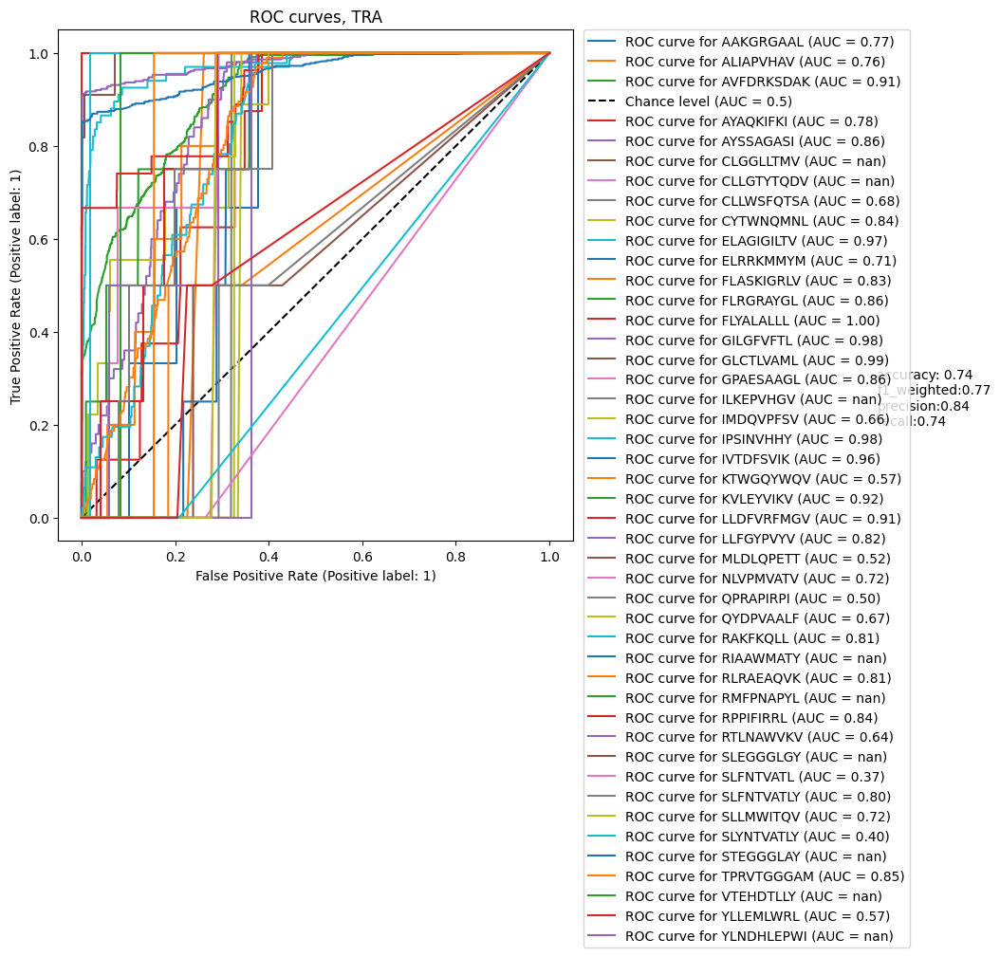

In [43]:
clf.roc_auc('TRA')

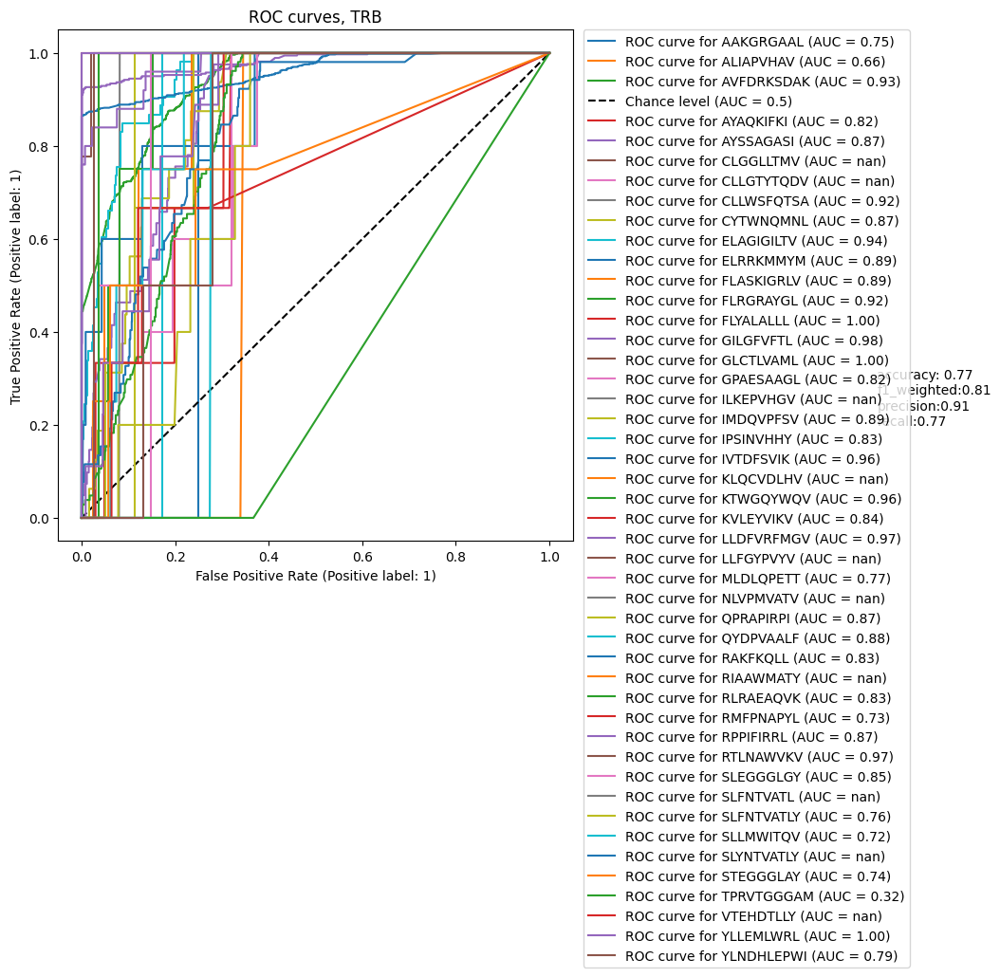

In [44]:
clf.roc_auc('TRB')

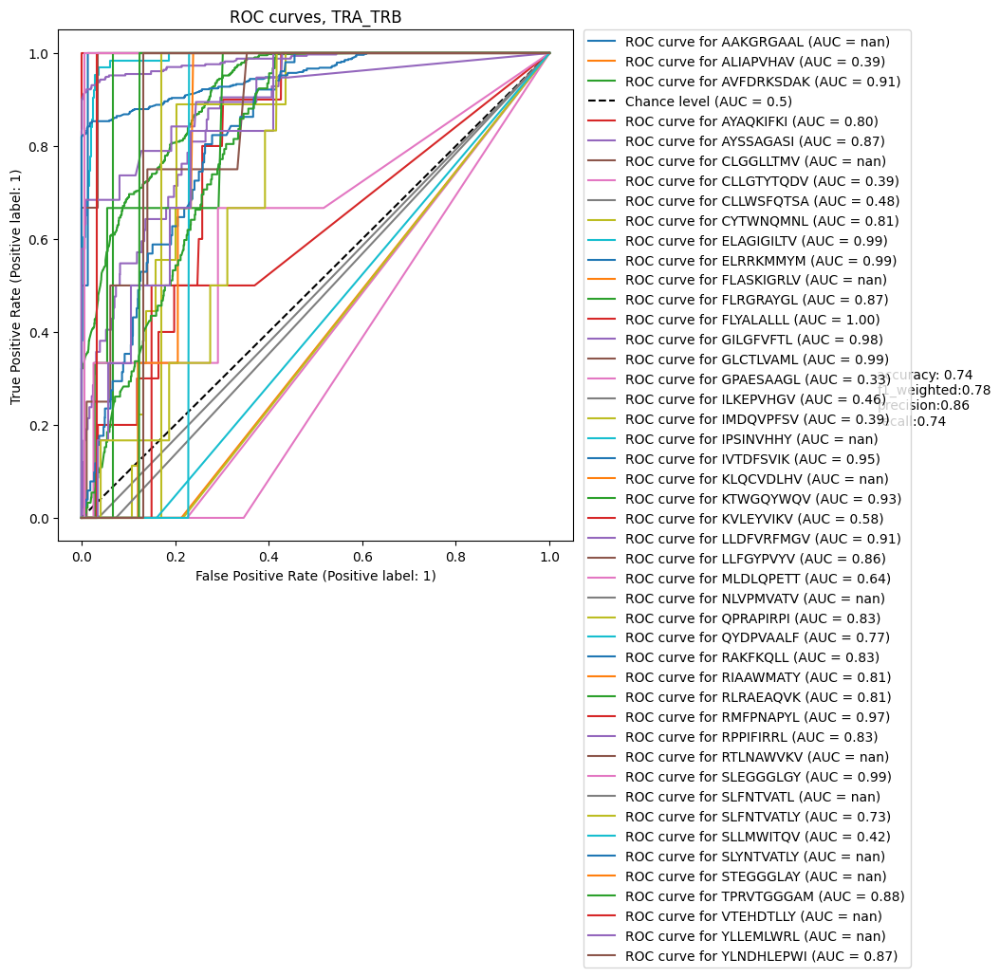

In [45]:
clf.roc_auc('TRA_TRB')

In [46]:
clf_high = TCRemb.TCRemb_clf('RF_high_100')
chain='TRA'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf_high.clf(chain,tcremb, label_high,test_size=0.15)

Train accuracy: 0.9298758217677137
Test accuracy: 0.735224586288416
macro: {'f1': 0.39877679618985673, 'precision': 0.4065333529345031, 'recall': 0.4474379734680854}
weighted: {'f1': 0.770360252831816, 'precision': 0.8532048751332991, 'recall': 0.735224586288416}


In [47]:
chain='TRB'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf_high.clf(chain,tcremb, label_high,test_size=0.15)

Train accuracy: 0.9425862068965517
Test accuracy: 0.77294921875
macro: {'f1': 0.3786238233947508, 'precision': 0.3624035766142225, 'recall': 0.5537936109742833}
weighted: {'f1': 0.8160912107230414, 'precision': 0.9131936272446869, 'recall': 0.77294921875}


In [49]:
chain='TRA_TRB'
#max_depth = 20
#model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clf_high.clf(chain,tcremb_paired, label_high,test_size=0.15)

Train accuracy: 0.9448616176786098
Test accuracy: 0.7399756986634265
macro: {'f1': 0.38679382517730543, 'precision': 0.38500396935203085, 'recall': 0.47316211516746276}
weighted: {'f1': 0.7780699231287204, 'precision': 0.8765677171534572, 'recall': 0.7399756986634265}


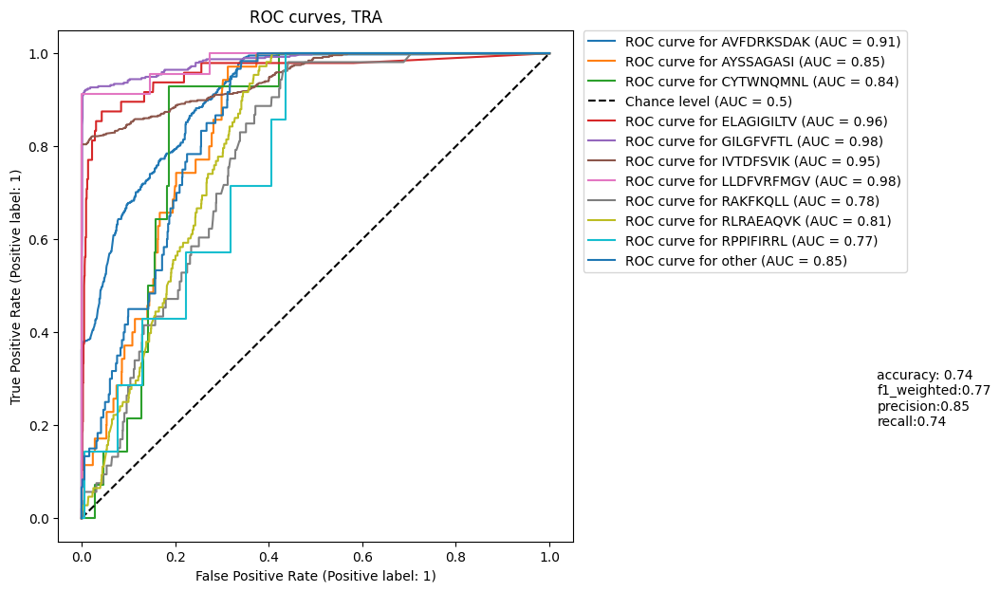

In [50]:
clf_high.roc_auc('TRA')

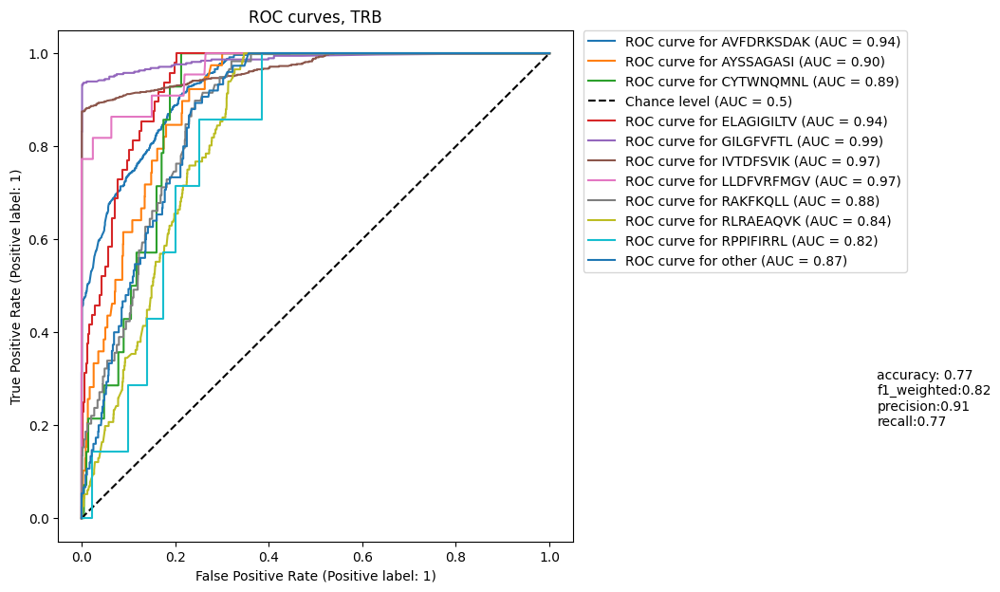

In [51]:
clf_high.roc_auc('TRB')

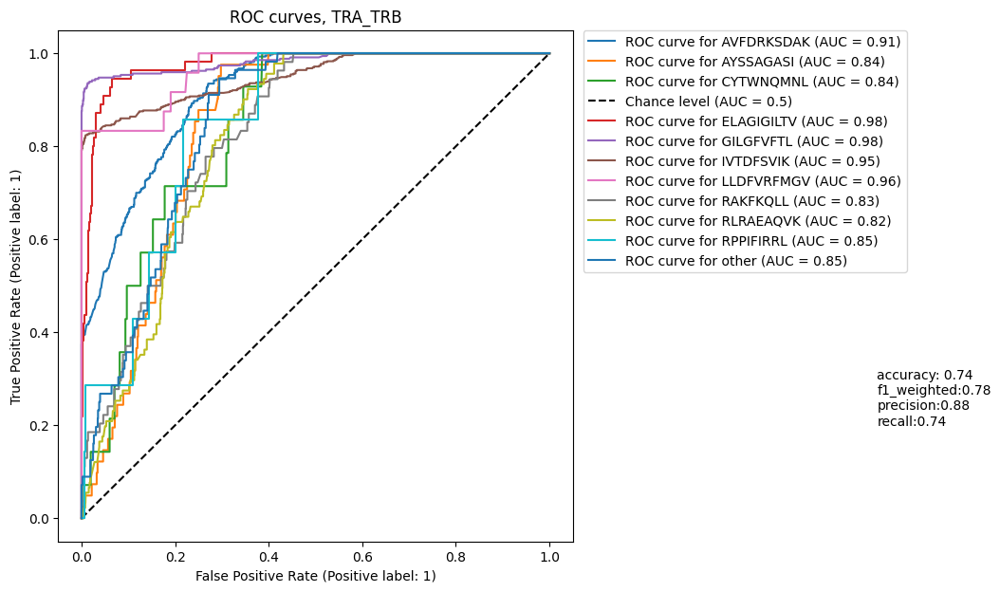

In [52]:
clf_high.roc_auc('TRA_TRB')

In [ ]:
model_name = 'RF'
clsf_dict[model_name]= {'model':{},'roc_auc':{}}
#tcremb['clsf_labels'][model_name]={}

In [ ]:
def clf_model(model, label_np, proc_df, annotation_id_column, chain, test_size = 0.3 ,show_legend=True):
    
    y_train, y_test,X_train, X_test  = train_test_split(label_np, proc_df.drop(annotation_id_column, axis=1, errors = 'ignore') ,test_size=test_size)
    model.fit(X_train, y_train)
    pred = model.predict(X_test)   
    print(f'Train accuracy: {model.score(X_train,y_train)}')
    print(f'Test accuracy: {model.score(X_test,y_test)}')
    
    roc_auc_df = TCRemb_code2.roc_auc(model, pred, y_test, X_test, chain, show_legend)
    
    return model, roc_auc_df.sort_values('roc_auc',ascending=False),y_train, y_test,X_train, X_test

Train accuracy: 0.9288402728769701
Test accuracy: 0.7510976948408342
good prediction: 36 classes with roc auc >= 0.6
failed: 11 classes with roc auc < 0.6


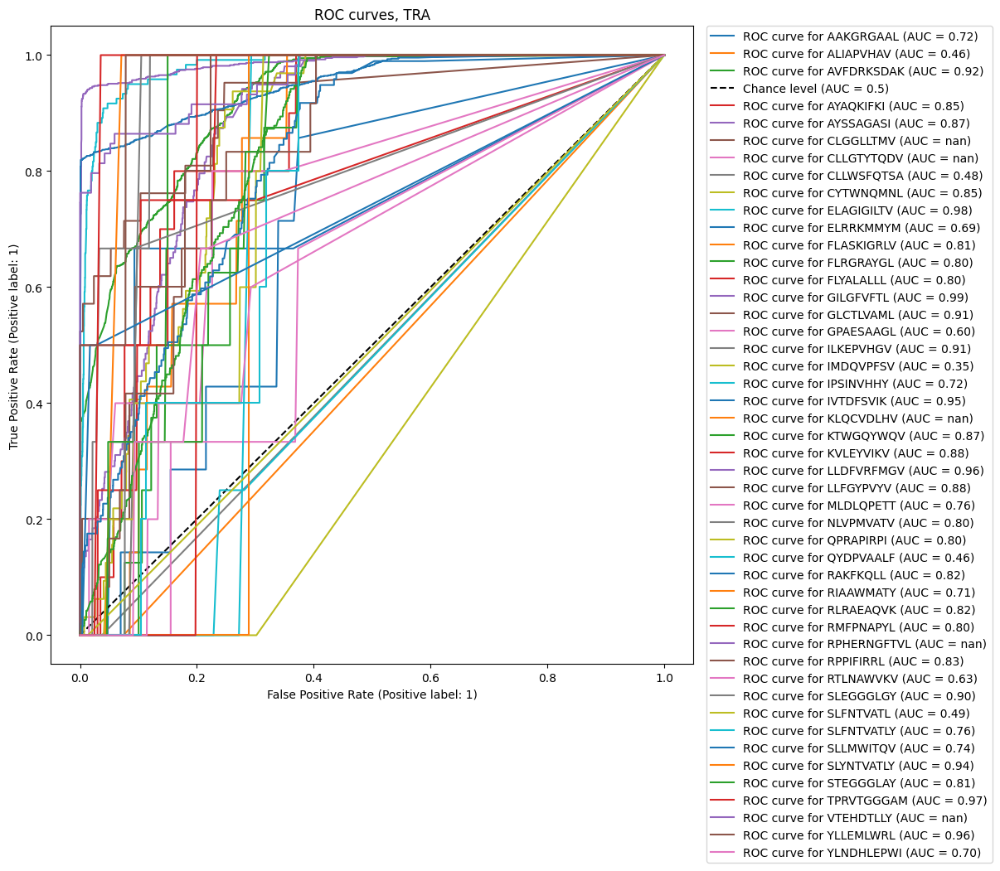

In [ ]:
chain = 'TRA'
max_depth = 20
y_data = tcremb['annot'][chain][label]
X_data = tcremb['pca'][chain]#.drop(annotation_id, axis=1, errors = 'ignore')

model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clsf_dict[model_name]['model'][chain], clsf_dict[model_name]['roc_auc'][chain],y_train, y_test,X_train, X_test = clf_model(model,y_data, X_data , annotation_id, chain, 0.3)


In [ ]:
clonotypes_in_train = {}

In [100]:

t = pd.merge(tcremb['annot'][chain],y_test,left_index=True, right_index=True)
t_train = pd.merge(tcremb['annot'][chain],y_train,left_index=True, right_index=True)
t['flag'] = t[clonotype_id_column].apply(lambda x: 1 if x in t_train[clonotype_id_column] else 0)
clonotypes_in_train[chain]=len(t[t['flag']==1])/len(t)

Train accuracy: 0.9427707998866749
Test accuracy: 0.7781449658515092
good prediction: 37 classes with roc auc >= 0.6
failed: 10 classes with roc auc < 0.6


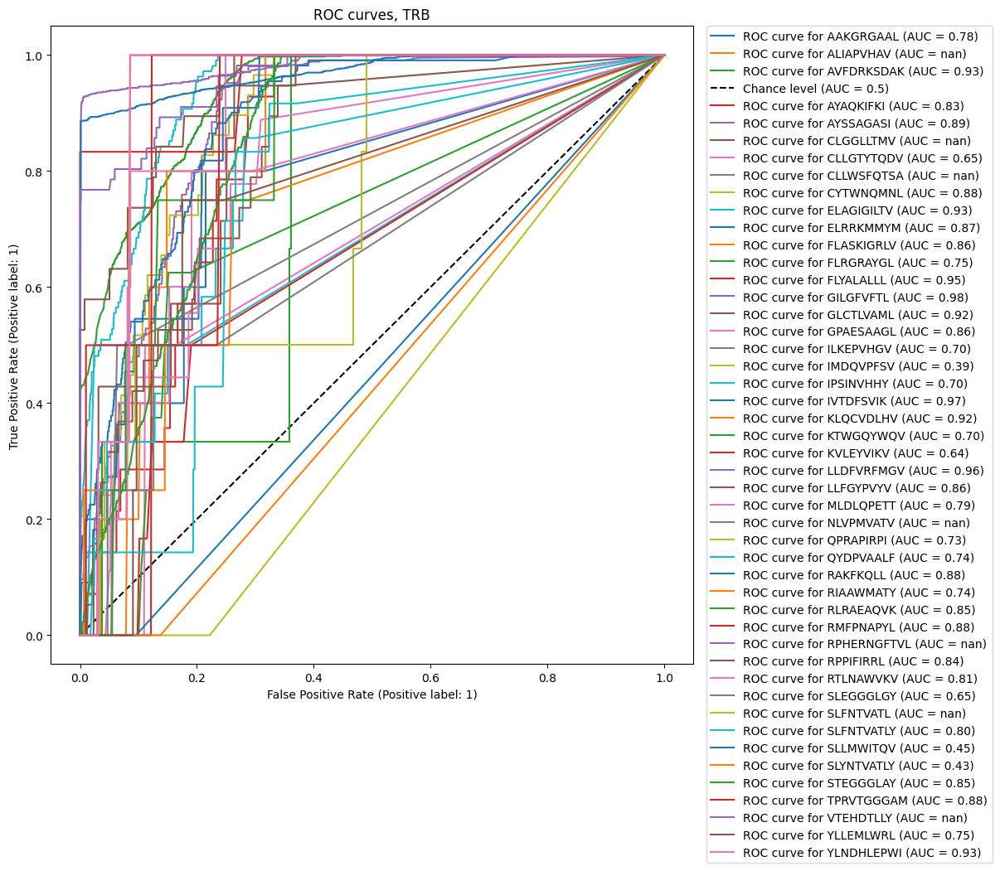

In [101]:
chain = 'TRB'
max_depth = 20
y_data = tcremb['annot'][chain][label]
X_data = tcremb['pca'][chain]#.drop(annotation_id, axis=1, errors = 'ignore')

model = RandomForestClassifier(max_depth=max_depth, random_state=0)
clsf_dict[model_name]['model'][chain], clsf_dict[model_name]['roc_auc'][chain],y_train, y_test,X_train, X_test = clf_model(model,y_data, X_data , annotation_id, chain, 0.3)


In [102]:
t = pd.merge(tcremb['annot'][chain],y_test,left_index=True, right_index=True)
t_train = pd.merge(tcremb['annot'][chain],y_train,left_index=True, right_index=True)
t['flag'] = t[clonotype_id_column].apply(lambda x: 1 if x in t_train[clonotype_id_column] else 0)
clonotypes_in_train[chain]=len(t[t['flag']==1])/len(t)

Text(0.5, 1.0, 'Fraction of barcodes with clonotypes present in train set, 10x donor1')

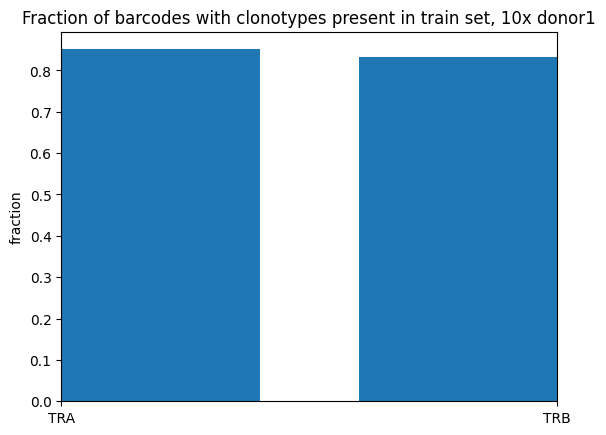

In [103]:
fig, ax = plt.subplots()
ax.bar(list(clonotypes_in_train.keys()),list(clonotypes_in_train.values()))
ax.set_xlim([0, 1])
ax.set_ylabel('fraction')
ax.set_title(f'Fraction of barcodes with clonotypes present in train set, 10x {donor}')

## Fig

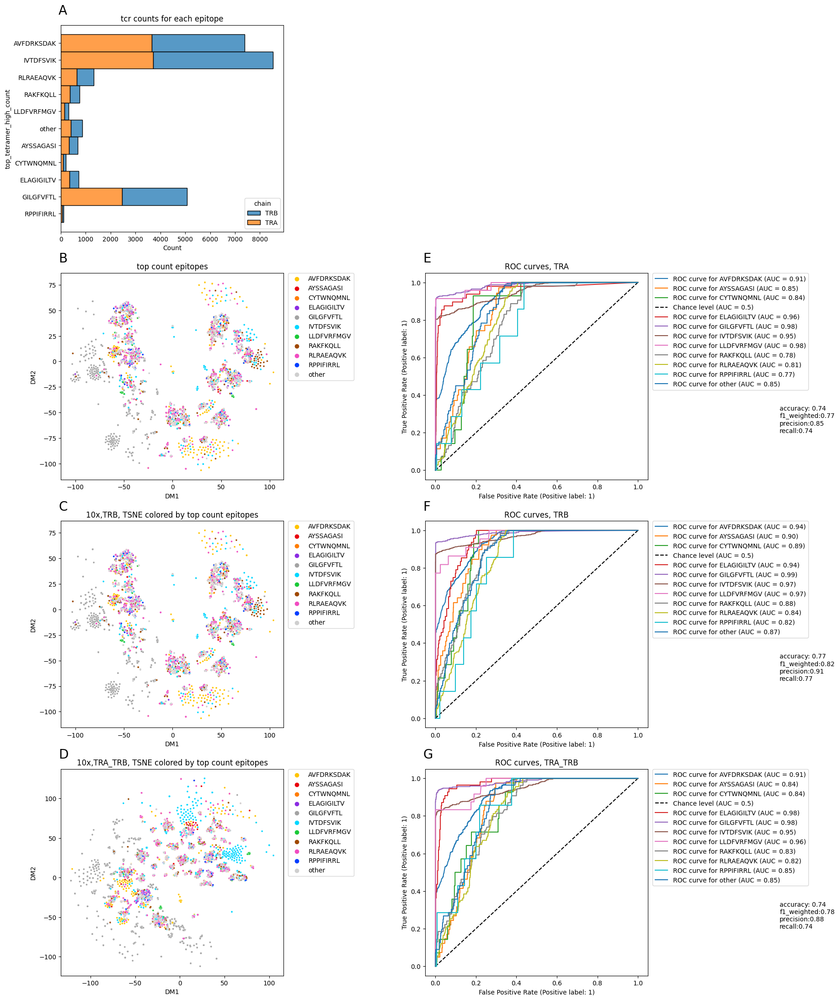

In [68]:

custom_palette = ml_utils.make_custom_palette(label_high_count)

fig = plt.figure(figsize=(20,27))

delta_x=-0.01
delta_y=1.1
font_size=20


gs00 = fig.add_gridspec(4, 6)

ax1 = fig.add_subplot(gs00[0, :2])
ax2 = fig.add_subplot(gs00[1, :2])
ax3 = fig.add_subplot(gs00[2, :2])
ax4 = fig.add_subplot(gs00[3, :2])
ax5 = fig.add_subplot(gs00[1, 3:5])
ax6 = fig.add_subplot(gs00[2, 3:5])
ax7 = fig.add_subplot(gs00[3, 3:5])


sns.histplot(data = data_preped, y = label_high,hue='chain',multiple='stack', ax=ax1)

ax1.text(delta_x, delta_y , 'A',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax1.transAxes,
        size=font_size)
ax1.set_title('tcr counts for each epitope')

chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tcremb.tsne[chain],tcremb.annot[chain]), label_high,f'10x,{chain}, TSNE colored by top count epitopes',custom_palette=custom_palette,ax=ax2)

ax2.text(delta_x, delta_y, 'B',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax2.transAxes,
        size=font_size)
ax2.set_title('top count epitopes')

chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tcremb.tsne[chain],tcremb.annot[chain]), label_high,f'10x,{chain}, TSNE colored by top count epitopes',custom_palette=custom_palette,ax=ax3)
ax3.text(delta_x, delta_y, 'C',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax3.transAxes,
        size=font_size)

chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tcremb_paired.tsne[chain],tcremb_paired.annot[chain]), label_high, f'10x,{chain}, TSNE colored by top count epitopes',custom_palette=custom_palette,ax=ax4)

ax4.text(delta_x, delta_y, 'D',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax4.transAxes,
        size=font_size)



clf_high.roc_auc('TRA',ax=ax5)

ax5.text(delta_x, delta_y, 'E',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax5.transAxes,
        size=font_size)


clf_high.roc_auc('TRB',ax=ax6)

ax6.text(delta_x, delta_y, 'F',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax6.transAxes,
        size=font_size)

clf_high.roc_auc('TRA_TRB',ax=ax7)

ax7.text(delta_x, delta_y, 'G',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax7.transAxes,
        size=font_size)

#plt.figtext(0.1, 0.001, 'Your-plot-metadata', ha='center', va='center')
#plt.savefig(str(outputs_path + "fig4.svg"))
#plt.savefig(str(outputs_path + "fig4.pdf"))
plt.savefig(str(outputs_path + "fig4.png"))
plt.show()





# Tetramers dimention

In [42]:
tetramers_obj_dict = {'donor1':{'annot_matrix':{},'annot_top_tetramer':{},'tetramers_dim':{}, 'pca':{},'tsne':{}}
                      ,'donor2':{'annot_matrix':{},'annot_top_tetramer':{},'tetramers_dim':{}, 'pca':{},'tsne':{}}
                      ,'donor3':{'annot_matrix':{},'annot_top_tetramer':{},'tetramers_dim':{}, 'pca':{},'tsne':{}}
                      ,'donor4':{'annot_matrix':{},'annot_top_tetramer':{},'tetramers_dim':{}, 'pca':{},'tsne':{}}}

In [43]:
donor = 'donor1'

In [44]:
matrix_path_preped = 'data/data_preped/' + '10x_matrix_' + donor + '.txt'
matrix = pd.read_csv(matrix_path_preped,sep='\t')

chain='TRA'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

chain='TRB'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

chain='TRA_TRB'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

In [45]:
donor = 'donor2'

In [46]:
matrix_path_preped = 'data/data_preped/' + '10x_matrix_' + donor + '.txt'
matrix = pd.read_csv(matrix_path_preped,sep='\t')

chain='TRA'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

chain='TRB'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

chain='TRA_TRB'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

In [47]:
donor = 'donor3'

In [48]:
matrix_path_preped = 'data/data_preped/' + '10x_matrix_' + donor + '.txt'
matrix = pd.read_csv(matrix_path_preped,sep='\t')

chain='TRA'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

chain='TRB'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

chain='TRA_TRB'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

In [49]:
donor = 'donor4'

In [50]:
matrix_path_preped = 'data/data_preped/' + '10x_matrix_' + donor + '.txt'
matrix = pd.read_csv(matrix_path_preped,sep='\t')

chain='TRA'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

chain='TRB'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

chain='TRA_TRB'
tetramers_obj_dict[donor]['annot_matrix'][chain] = tcremb_dict[donor].annot[chain].rename({'count':'top_tetramer_count'},axis=1).merge(matrix.rename({'value':'tetramer'},axis=1),on='barcode')
tetramers_obj_dict[donor]['annot_matrix'][chain] = data_proc.norm_logp(tetramers_obj_dict[donor]['annot_matrix'][chain], 'count')
tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']=tetramers_obj_dict[donor]['annot_matrix'][chain]['top_tetramer'].str.split('_',expand=True)[0]
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_matrix'][chain][tetramers_obj_dict[donor]['annot_matrix'][chain]['epitope']==tetramers_obj_dict[donor]['annot_matrix'][chain]['tetramer']]
tetramers_obj_dict[donor]['tetramers_dim'][chain] = data_proc.pivot_data(tetramers_obj_dict[donor]['annot_matrix'][chain])
tetramers_obj_dict[donor]['annot_top_tetramer'][chain] = tetramers_obj_dict[donor]['annot_top_tetramer'][chain].merge(dbscan_dict[donor].clstr_labels[chain].merge(tcremb_dict[donor].annot[chain][['annotId','barcode']]))

In [51]:
n = 10

init = 'pca'
random_state = 4
perplexity = 15

In [52]:
donor='donor1'

In [53]:
chain = 'TRA'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)
chain = 'TRB'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)
chain = 'TRA_TRB'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)


In [54]:
donor='donor2'

In [55]:
chain = 'TRA'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)
chain = 'TRB'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)
chain = 'TRA_TRB'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)


In [56]:
donor='donor3'

In [57]:
chain = 'TRA'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)
chain = 'TRB'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)
chain = 'TRA_TRB'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)


In [58]:
donor='donor4'

In [59]:
chain = 'TRA'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)
chain = 'TRB'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)
chain = 'TRA_TRB'
tetramers_obj_dict[donor]['pca'][chain] = ml_utils.pca_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index(), 'barcode',n)
tetramers_obj_dict[donor]['tsne'][chain] = ml_utils.tsne_proc(tetramers_obj_dict[donor]['tetramers_dim'][chain].reset_index() , 'barcode', init, random_state, perplexity)


NameError: name 'color_p' is not defined

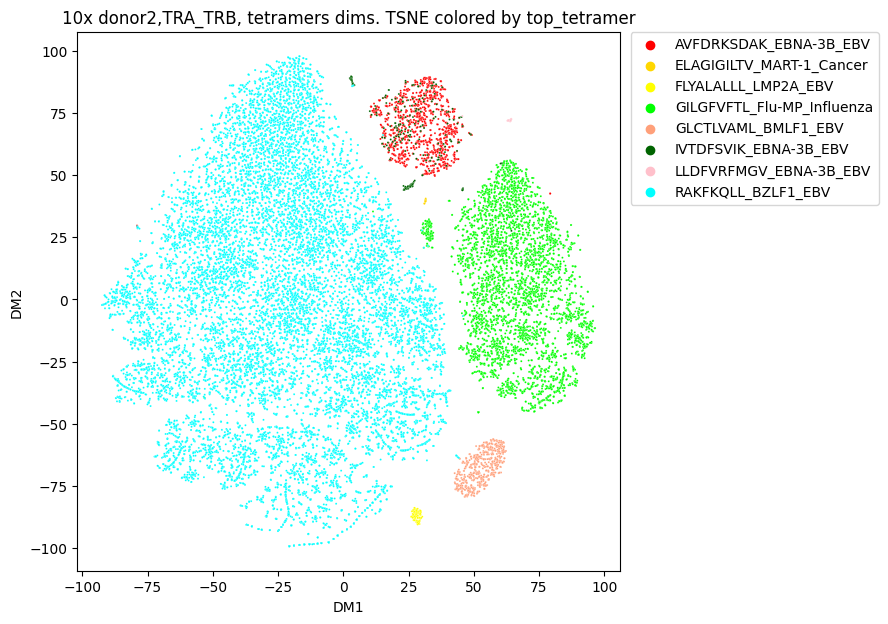

In [60]:
donor='donor2'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette)


#ax1.set_title('tcr counts for each epitope')

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p)


In [61]:
color_p = {1:'fuchsia',0:'silver'}

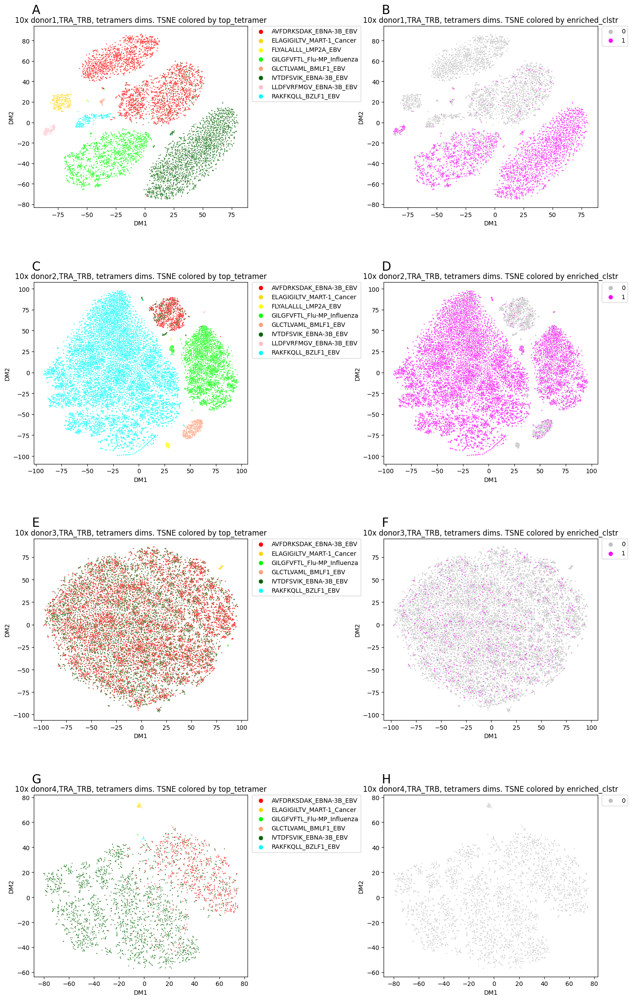

In [82]:
chain = 'TRA_TRB'

fig = plt.figure(figsize=(20,30))

delta_x=-0.01
delta_y=1.12
font_size=20


gs00 = fig.add_gridspec(16, 6)

ax1 = fig.add_subplot(gs00[:3, :2])
ax2 = fig.add_subplot(gs00[:3, 3:5])
ax3 = fig.add_subplot(gs00[4:7, :2])
ax4 = fig.add_subplot(gs00[4:7, 3:5])
ax5 = fig.add_subplot(gs00[8:11, :2])
ax6 = fig.add_subplot(gs00[8:11, 3:5])
ax7 = fig.add_subplot(gs00[12:15, :2])
ax8 = fig.add_subplot(gs00[12:15, 3:5])


donor='donor1'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax1)

ax1.text(delta_x, delta_y, 'A',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax1.transAxes,
        size=font_size)
#ax1.set_title('tcr counts for each epitope')

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p, ax=ax2)
ax2.text(delta_x, delta_y, 'B',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax2.transAxes,
        size=font_size)
#ax2.set_title('top count epitopes')

donor='donor2'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax3)

ax3.text(delta_x, delta_y, 'C',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax3.transAxes,
        size=font_size)

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p, ax=ax4)
ax4.text(delta_x, delta_y, 'D',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax4.transAxes,
        size=font_size)

donor='donor3'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax5)

ax5.text(delta_x, delta_y, 'E',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax5.transAxes,
        size=font_size)

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p,ax=ax6)
ax6.text(delta_x, delta_y, 'F',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax6.transAxes,
        size=font_size)

donor='donor4'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax7)

ax5.text(delta_x, delta_y, 'G',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax7.transAxes,
        size=font_size)

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p,ax=ax8)
ax6.text(delta_x, delta_y, 'H',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax8.transAxes,
        size=font_size)

plt.savefig(f"results/figures/tetramers_dim.png",bbox_inches='tight')

In [84]:
donor='donor1'

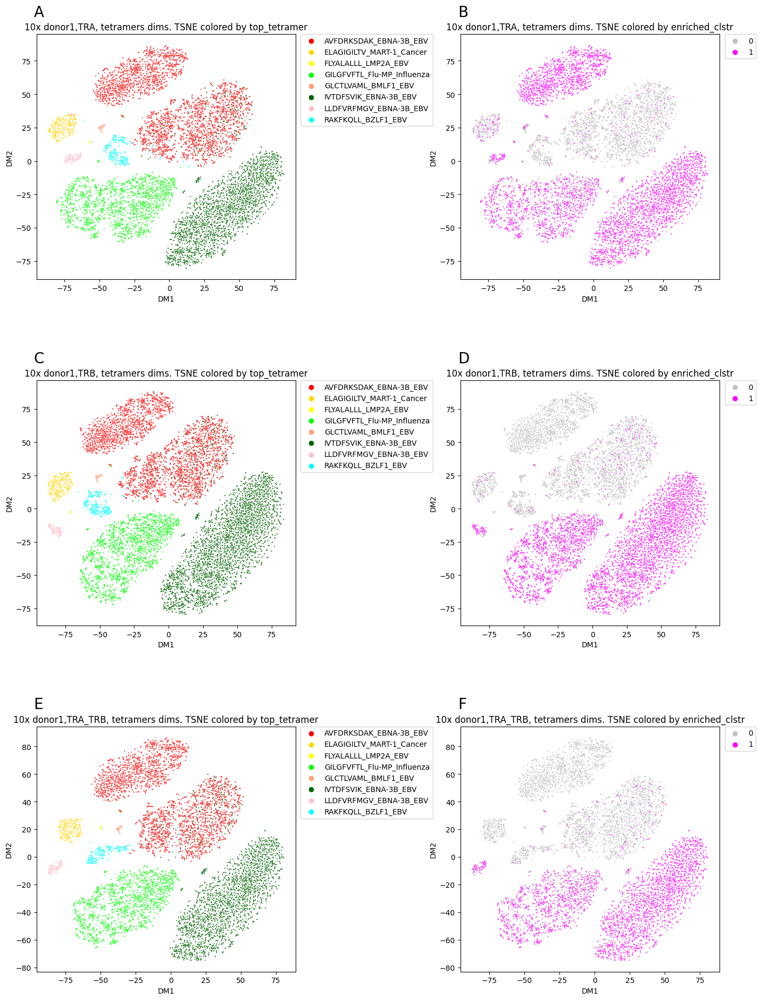

In [85]:
fig = plt.figure(figsize=(20,25))

delta_x=-0.01
delta_y=1.12
font_size=20


gs00 = fig.add_gridspec(12, 6)

ax1 = fig.add_subplot(gs00[:3, :2])
ax2 = fig.add_subplot(gs00[:3, 3:5])
ax3 = fig.add_subplot(gs00[4:7, :2])
ax4 = fig.add_subplot(gs00[4:7, 3:5])
ax5 = fig.add_subplot(gs00[8:11, :2])
ax6 = fig.add_subplot(gs00[8:11, 3:5])



chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax1)

ax1.text(delta_x, delta_y, 'A',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax1.transAxes,
        size=font_size)
#ax1.set_title('tcr counts for each epitope')

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p, ax=ax2)
ax2.text(delta_x, delta_y, 'B',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax2.transAxes,
        size=font_size)
#ax2.set_title('top count epitopes')

chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax3)

ax3.text(delta_x, delta_y, 'C',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax3.transAxes,
        size=font_size)

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p, ax=ax4)
ax4.text(delta_x, delta_y, 'D',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax4.transAxes,
        size=font_size)

chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax5)

ax5.text(delta_x, delta_y, 'E',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax5.transAxes,
        size=font_size)

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p,ax=ax6)
ax6.text(delta_x, delta_y, 'F',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax6.transAxes,
        size=font_size)

plt.savefig(f"results/figures/tetramers_dim_{donor}.png",bbox_inches='tight')

In [86]:
donor='donor2'

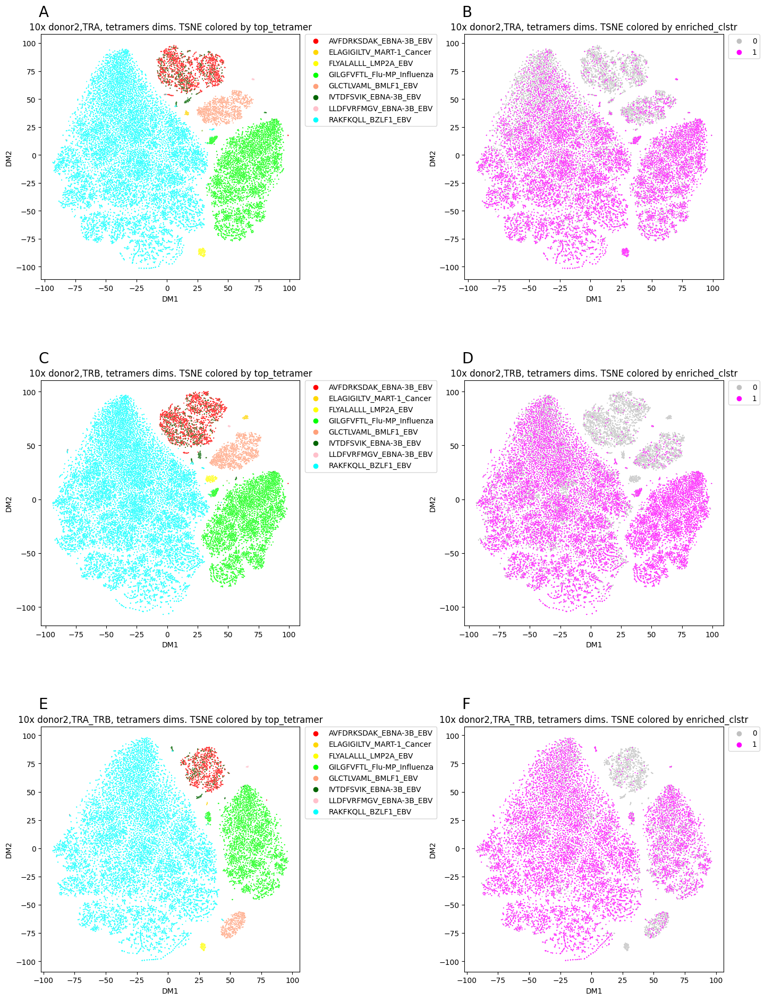

In [87]:
fig = plt.figure(figsize=(20,25))

delta_x=-0.01
delta_y=1.12
font_size=20


gs00 = fig.add_gridspec(12, 6)

ax1 = fig.add_subplot(gs00[:3, :2])
ax2 = fig.add_subplot(gs00[:3, 3:5])
ax3 = fig.add_subplot(gs00[4:7, :2])
ax4 = fig.add_subplot(gs00[4:7, 3:5])
ax5 = fig.add_subplot(gs00[8:11, :2])
ax6 = fig.add_subplot(gs00[8:11, 3:5])



chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax1)

ax1.text(delta_x, delta_y, 'A',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax1.transAxes,
        size=font_size)
#ax1.set_title('tcr counts for each epitope')

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p, ax=ax2)
ax2.text(delta_x, delta_y, 'B',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax2.transAxes,
        size=font_size)
#ax2.set_title('top count epitopes')

chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax3)

ax3.text(delta_x, delta_y, 'C',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax3.transAxes,
        size=font_size)

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p, ax=ax4)
ax4.text(delta_x, delta_y, 'D',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax4.transAxes,
        size=font_size)

chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax5)

ax5.text(delta_x, delta_y, 'E',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax5.transAxes,
        size=font_size)

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p,ax=ax6)
ax6.text(delta_x, delta_y, 'F',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax6.transAxes,
        size=font_size)

plt.savefig(f"results/figures/tetramers_dim_{donor}.png",bbox_inches='tight')

In [88]:
donor='donor3'

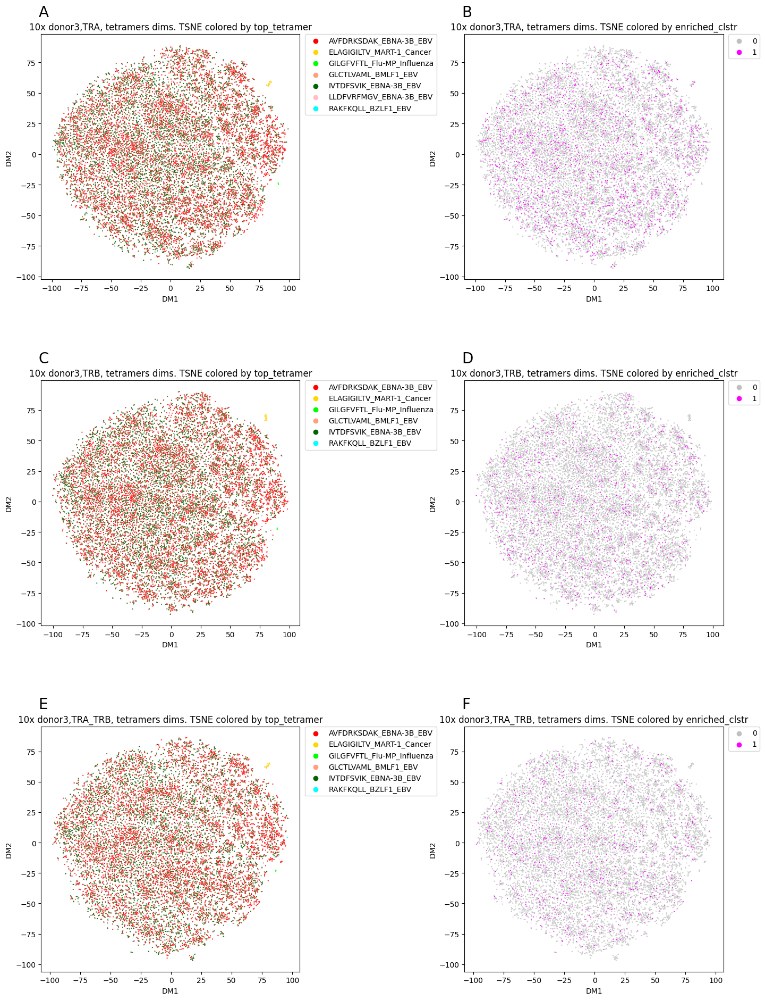

In [89]:
fig = plt.figure(figsize=(20,25))

delta_x=-0.01
delta_y=1.12
font_size=20


gs00 = fig.add_gridspec(12, 6)

ax1 = fig.add_subplot(gs00[:3, :2])
ax2 = fig.add_subplot(gs00[:3, 3:5])
ax3 = fig.add_subplot(gs00[4:7, :2])
ax4 = fig.add_subplot(gs00[4:7, 3:5])
ax5 = fig.add_subplot(gs00[8:11, :2])
ax6 = fig.add_subplot(gs00[8:11, 3:5])



chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax1)

ax1.text(delta_x, delta_y, 'A',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax1.transAxes,
        size=font_size)
#ax1.set_title('tcr counts for each epitope')

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p, ax=ax2)
ax2.text(delta_x, delta_y, 'B',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax2.transAxes,
        size=font_size)
#ax2.set_title('top count epitopes')

chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax3)

ax3.text(delta_x, delta_y, 'C',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax3.transAxes,
        size=font_size)

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p, ax=ax4)
ax4.text(delta_x, delta_y, 'D',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax4.transAxes,
        size=font_size)

chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax5)

ax5.text(delta_x, delta_y, 'E',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax5.transAxes,
        size=font_size)

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p,ax=ax6)
ax6.text(delta_x, delta_y, 'F',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax6.transAxes,
        size=font_size)

plt.savefig(f"results/figures/tetramers_dim_{donor}.png",bbox_inches='tight')

In [90]:
donor='donor4'

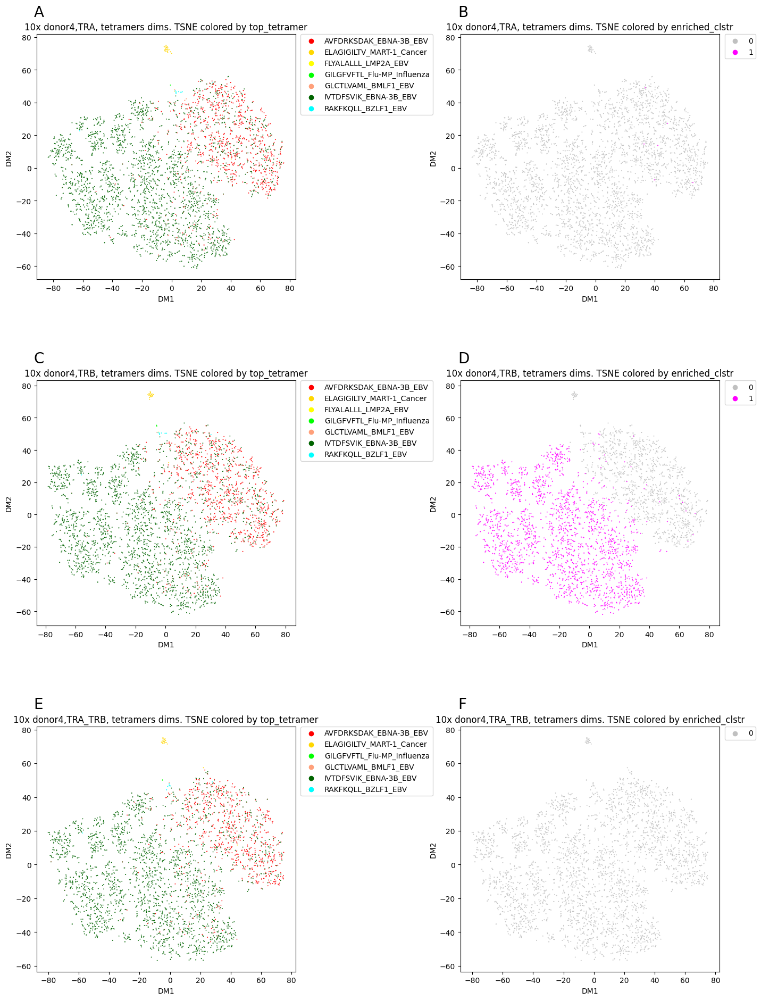

In [91]:
fig = plt.figure(figsize=(20,25))

delta_x=-0.01
delta_y=1.12
font_size=20


gs00 = fig.add_gridspec(12, 6)

ax1 = fig.add_subplot(gs00[:3, :2])
ax2 = fig.add_subplot(gs00[:3, 3:5])
ax3 = fig.add_subplot(gs00[4:7, :2])
ax4 = fig.add_subplot(gs00[4:7, 3:5])
ax5 = fig.add_subplot(gs00[8:11, :2])
ax6 = fig.add_subplot(gs00[8:11, 3:5])



chain = 'TRA'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax1)

ax1.text(delta_x, delta_y, 'A',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax1.transAxes,
        size=font_size)
#ax1.set_title('tcr counts for each epitope')

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p, ax=ax2)
ax2.text(delta_x, delta_y, 'B',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax2.transAxes,
        size=font_size)
#ax2.set_title('top count epitopes')

chain = 'TRB'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax3)

ax3.text(delta_x, delta_y, 'C',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax3.transAxes,
        size=font_size)

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p, ax=ax4)
ax4.text(delta_x, delta_y, 'D',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax4.transAxes,
        size=font_size)

chain = 'TRA_TRB'
ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), label, title = f'10x {donor},{chain}, tetramers dims. TSNE colored by {label}',custom_palette = custom_palette, ax=ax5)

ax5.text(delta_x, delta_y, 'E',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax5.transAxes,
        size=font_size)

ml_utils.tsne_plot(pd.merge(tetramers_obj_dict[donor]['tsne'][chain],tetramers_obj_dict[donor]['annot_top_tetramer'][chain],on='barcode'), 'enriched_clstr', title = f'10x {donor},{chain}, tetramers dims. TSNE colored by enriched_clstr', custom_palette = color_p,ax=ax6)
ax6.text(delta_x, delta_y, 'F',
     horizontalalignment='left',
     verticalalignment='top',
    transform=ax6.transAxes,
        size=font_size)

plt.savefig(f"results/figures/tetramers_dim_{donor}.png",bbox_inches='tight')

In [53]:
init = 'pca'
random_state = 4
perplexity = 15

In [ ]:
chain = 'TRA'
t = tcremb['annot'][chain].copy()
t = t.drop_duplicates([clonotype_id_column,label])
t['top_tetramers_n']=t.groupby(clonotype_id_column)[label].transform('count')
mixed_clones= list(t[t['top_tetramers_n']>1][clonotype_id_column].drop_duplicates())
tetramers_obj['annot_matrix'][chain]['cross'] = tetramers_obj['annot_matrix'][chain].apply(lambda x: 1 if x[clonotype_id_column] in mixed_clones else 0,axis=1)

In [ ]:
chain = 'TRB'
t = tcremb['annot'][chain].copy()
t = t.drop_duplicates([clonotype_id_column,label])
t['top_tetramers_n']=t.groupby(clonotype_id_column)[label].transform('count')
mixed_clones= list(t[t['top_tetramers_n']>1][clonotype_id_column].drop_duplicates())
tetramers_obj['annot_matrix'][chain]['cross'] = tetramers_obj['annot_matrix'][chain].apply(lambda x: 1 if x[clonotype_id_column] in mixed_clones else 0,axis=1)

In [ ]:
tetramers_obj['annot_matrix']['TRB']['cross'] = tetramers_obj['annot_matrix']['TRB'].apply(lambda x: 1 if x[clonotype_id_column] in trb_mixed_cloned else 0,axis=1)

0         1
1         1
2         1
3         1
4         1
         ..
143888    1
143889    1
143890    1
143891    1
143892    1
Length: 97246, dtype: int64

In [ ]:
chain = 'TRB'
TCRemb_code2.tsne_plot(pd.merge(tetramers_obj['tsne'][chain],tetramers_obj['annot_matrix'][chain],on='barcode'), label_high, f'10x {donor},{chain}, tetramers dims', f'TSNE colored by {label_high}', True)
TCRemb_code2.tsne_plot(pd.merge(tetramers_obj['tsne'][chain],tetramers_obj['annot_matrix'][chain],on='barcode'), 'enriched_clstr', f'10x {donor},{chain}, tetramers dims', f'TSNE colored by enriched_clstr', True)


In [228]:
t = tcremb['clstr_labels']['KMeans'][chain].merge(tcremb['annot'][chain])

In [233]:
t[t['enriched_clstr']==1].drop_duplicates(label)

,cluster,annotId,clstr_top_tetramer,total_cluster,total_group,count_mached,fraction_mached,fraction_mached_exp,p_value,enriched_clstr,...,cdr3_nt,reads,umis,raw_clonotype_id,raw_consensus_id,top_tetramer,count,data_id,top_tetramer_high_count,cloneId
5,76,5,FLYALALLL,17,26,14,0.823529,0.002141,2.867242e-35,1,...,TGTGCTACGGAGGGGAATTCAGGATACAGCACCCTCACCTTT,92096,32,clonotype271,clonotype271_consensus_2,FLYALALLL,21,37517,other,5374
10,9,11,AVFDRKSDAK,1142,3130,1138,0.996497,0.257698,0.000000e+00,1,...,TGTGCTGTGGGTGACAACTTCAACAAATTTTACTTT,35120,31,clonotype2,clonotype2_consensus_1,AVFDRKSDAK,328,48137,AVFDRKSDAK,5737
11,49,13,AVFDRKSDAK,4,3130,3,0.750000,0.257698,5.522294e-02,1,...,TGCATCCTGAGAGACAGAGATGACAAGATCATCTTT,49871,30,clonotype321,clonotype321_consensus_2,IVTDFSVIK,5,24811,IVTDFSVIK,7094
19,109,21,LLDFVRFMGV,72,166,70,0.972222,0.013667,7.816534e-128,1,...,TGTGCTACCTTTAACAATGCAGGCAACATGCTCACCTTT,98152,26,clonotype15354,clonotype15354_consensus_2,AYSSAGASI,8,25762,AYSSAGASI,5385
33,50,36,GILGFVFTL,18,2730,18,1.000000,0.224765,2.143526e-12,1,...,TGTGCTGCGAGACCCTCTTTT,52438,22,clonotype165,clonotype165_consensus_1,GILGFVFTL,186,36066,GILGFVFTL,169
103,109,116,LLDFVRFMGV,72,166,70,0.972222,0.013667,7.816534e-128,1,...,TGTGCTGCGATAAATAATGCAGGCAACATGCTCACCTTT,45274,16,clonotype49,clonotype49_consensus_1,LLDFVRFMGV,141,22308,LLDFVRFMGV,61
163,842,184,ELAGIGILTV,7,371,6,0.857143,0.030545,5.536303e-09,1,...,TGTGCCGTGAACATCGGGAAATTAACCTTT,50725,14,clonotype13505,clonotype13505_consensus_1,ELAGIGILTV,27,22515,ELAGIGILTV,6063
247,219,274,AVFDRKSDAK,11,3130,9,0.818182,0.257698,1.627667e-04,1,...,TGTGCTCTGAGTCTCAAATACAACTTCAACAAATTTTACTTT,31693,13,clonotype61,clonotype61_consensus_2,RLRAEAQVK,5,11355,RLRAEAQVK,1477
254,2001,281,ELAGIGILTV,9,371,7,0.777778,0.030545,8.459829e-10,1,...,TGTGCCGTGAAAGTCGACCAGTTCTATTTT,29441,13,clonotype26246,clonotype26246_consensus_1,SLFNTVATLY,10,45950,other,5937
317,1238,346,GLCTLVAML,3,45,3,1.000000,0.003705,5.085547e-08,1,...,TGTGCAGAGTTGAAGGAAAAGCTGATTTTT,38340,12,clonotype730,clonotype730_consensus_1,GLCTLVAML,35,49635,other,526


In [241]:
t[(t['enriched_clstr']==0)&(t['count']>1000)]

,cluster,annotId,clstr_top_tetramer,total_cluster,total_group,count_mached,fraction_mached,fraction_mached_exp,p_value,enriched_clstr,...,cdr3_nt,reads,umis,raw_clonotype_id,raw_consensus_id,top_tetramer,count,data_id,top_tetramer_high_count,cloneId
3972,26,4394,IVTDFSVIK,4,3815,1,0.25,0.314095,0.778662,0,...,TGTGCAGCAAGCGCGAGTAGAGATGACAAGATCATCTTT,7696,5,clonotype30325,clonotype30325_consensus_2,AAKGRGAAL,76112470,53171,other,206


In [242]:
statistics.median(t[t['enriched_clstr']==0]['count'])

9

In [243]:
statistics.median(t[t['enriched_clstr']==1]['count'])

181

In [252]:
t

,cluster,annotId,clstr_top_tetramer,total_cluster,total_group,count_mached,fraction_mached,fraction_mached_exp,p_value,enriched_clstr,...,cdr3_nt,reads,umis,raw_clonotype_id,raw_consensus_id,top_tetramer,count,data_id,top_tetramer_high_count,cloneId
0,1911,0,AVFDRKSDAK,1,3130,1,1.000000,0.257698,2.576980e-01,0,...,TGTGCTGTGACCGACAGCTGGGGGAAATTGCAGTTT,108619,53,clonotype18308,clonotype18308_consensus_2,AVFDRKSDAK,11,31441,AVFDRKSDAK,6741
1,595,1,AVFDRKSDAK,2,3130,2,1.000000,0.257698,6.640826e-02,0,...,TGTGCTTATAGGAGCGCGAAGGATAGCAGCTATAAATTGATCTTC,82579,34,clonotype4925,clonotype4925_consensus_1,AVFDRKSDAK,9,6587,AVFDRKSDAK,6939
2,81,2,AVFDRKSDAK,45,3130,33,0.733333,0.257698,3.375186e-11,0,...,TGTGCTGTGGACCCTATGGACACGGGCAGGAGAGCACTTACTTTT,59875,34,clonotype13,clonotype13_consensus_1,AVFDRKSDAK,18,39202,AVFDRKSDAK,5615
3,13,3,AVFDRKSDAK,112,3130,59,0.526786,0.257698,1.188737e-09,0,...,TGTGCTGTGCATGGCTATGGTCAGAATTTTGTCTTT,122761,33,clonotype6,clonotype6_consensus_1,AVFDRKSDAK,13,19797,AVFDRKSDAK,5830
4,1325,4,AVFDRKSDAK,1,3130,1,1.000000,0.257698,2.576980e-01,0,...,TGTGCTACGGGTGATAACTATGGTCAGAATTTTGTCTTT,50043,33,clonotype4041,clonotype4041_consensus_1,AVFDRKSDAK,15,4874,AVFDRKSDAK,5391
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12141,0,13178,IVTDFSVIK,2674,3815,2672,0.999252,0.314095,0.000000e+00,1,...,TGTGCTGGTCACACCGGTAACCAGTTCTATTTT,119,1,NaN,NaN,IVTDFSVIK,103,53634,IVTDFSVIK,903
12142,0,13179,IVTDFSVIK,2674,3815,2672,0.999252,0.314095,0.000000e+00,1,...,TGTGCTGGTCACACCGGTAACCAGTTCTATTTT,108,1,clonotype1,clonotype1_consensus_1,IVTDFSVIK,68,30089,IVTDFSVIK,903
12143,0,13180,IVTDFSVIK,2674,3815,2672,0.999252,0.314095,0.000000e+00,1,...,TGTGCTGGTCACACCGGTAACCAGTTCTATTTT,106,1,NaN,NaN,IVTDFSVIK,161,54253,IVTDFSVIK,903
12144,0,13181,IVTDFSVIK,2674,3815,2672,0.999252,0.314095,0.000000e+00,1,...,TGTGCTGGTCACACCGGTAACCAGTTCTATTTT,101,1,NaN,NaN,IVTDFSVIK,242,55660,IVTDFSVIK,903


In [247]:
t['enriched_clstr'] = t['enriched_clstr'].astype(str)

<Axes: >

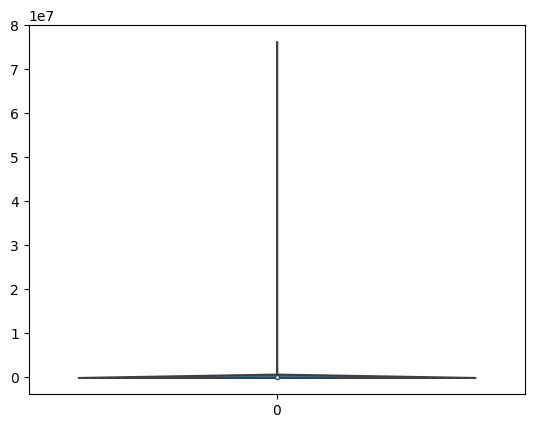

In [256]:
sns.violinplot(t['count'])